In [21]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from scipy.spatial import KDTree
from ipywidgets import interact, FloatSlider, fixed
from scipy.spatial.distance import cdist
from scipy.optimize import minimize
import scipy.stats 

def load_and_process_image(image_path):
    image = Image.open(image_path).convert('L')  # Convert to grayscale
    image_array = np.array(image)

    # Define the crop region to exclude the axes (adjust the border as needed)
    crop_border = 125
    cropped_image = image_array[crop_border:-crop_border, crop_border:-crop_border]

    # Invert the image colors for better clarity
    inverted_image = 255 - cropped_image

    # Normalize the image to a range of 0 to 1
    normalized_image = inverted_image / 1 #255.0

    # Threshold the image to create a binary image
    _, binary_image = cv2.threshold(normalized_image, 0.3, 1.0, cv2.THRESH_BINARY)

    # Find all y, x coordinates where the image intensity is 1 (part of the spiral)
    y_coords, x_coords = np.where(binary_image == 1)
    return x_coords, y_coords

def archimedean_spiral(theta, a, b):
    return a + b * theta

def generate_spiral_from_points(p1, p2, num_points, rev=3):
    # Calculate the radius and angle offset
    r = np.linalg.norm(np.array(p1) - np.array(p2))
    theta_offset = np.arctan2(p1[1] - p2[1], p1[0] - p2[0])

    # Generate the spiral
    theta = np.linspace(0, 2 * np.pi * rev, num_points) + theta_offset
    t = np.linspace(0, r, num_points)
    x = np.cos(theta) * t + p2[0]
    y = np.sin(theta) * t + p2[1]

    return x, y



def objective_function(params, hand_drawn_points):
    p1_x, p1_y, p2_x, p2_y, revs = params
    p1 = (p1_x, p1_y)
    p2 = (p2_x, p2_y)
    num_points = len(hand_drawn_points[0])
    gen_x, gen_y = generate_spiral_from_points(p1, p2, num_points, 3)
    # Calculate the minimum distance from each hand-drawn point to the generated spiral
    distances = cdist(np.vstack((gen_x, gen_y)).T, hand_drawn_points.T, 'euclidean').min(axis=1)
    return np.sum(distances)

def spiral_comparison(extracted_x, extracted_y, p1_x, p1_y, p2_x, p2_y, plot=True):
    # Generate the Archimedean spiral from two points
    num_points = len(extracted_x)
    template_x, template_y = generate_spiral_from_points([p1_x, p1_y], [p2_x, p2_y], num_points)

    # Normalize the extracted spiral points (rename comparison_x/y to extracted_x/y)
    comparison_points = np.column_stack((extracted_x, extracted_y))
    comparison_min, comparison_max = comparison_points.min(axis=0), comparison_points.max(axis=0)
    norm_comparison_points = (comparison_points - comparison_min) / (comparison_max - comparison_min)

    # Normalize the template spiral points
    template_points = np.column_stack((template_x, template_y))
    template_min, template_max = template_points.min(axis=0), template_points.max(axis=0)
    norm_template_points = (template_points - template_min) / (template_max - template_min)

    # Calculate the distances using KDTree for nearest neighbor search
    template_kdtree = KDTree(template_points)
    distances, _ = template_kdtree.query(comparison_points)

    # Apply a rolling average to the distances
    rolling_window_size = 10
    rolling_avg_distances = np.convolve(distances, np.ones(rolling_window_size)/rolling_window_size, mode='valid')
    adjusted_x_axis = np.arange(rolling_window_size//2, len(distances) - (rolling_window_size//2 - 1))

    # Plot the distances and rolling average with the corrected x-axis
    
    print(f'the mean distance from template {np.mean(distances)} and variance {np.var(distances)}')
    
    if plot:
        # Distance plot
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.plot(distances, label="Pointwise Distances")
        plt.plot(adjusted_x_axis, rolling_avg_distances, label="Rolling Average", color='red')
        plt.title("Distances to Template")
        plt.xlabel("Point Index")
        plt.ylabel("Normalized Distance")
        plt.legend()

        # Overlaid spirals plot
        plt.subplot(1, 2, 2)
        plt.scatter(comparison_points[:, 0], comparison_points[:, 1], s=1, label="Comparison Spiral")
        plt.scatter(template_points[:, 0], template_points[:, 1], s=1, label="Template Spiral", color='red')
        plt.title("Overlaid Spirals")
        plt.xlabel("Normalized X")
        plt.ylabel("Normalized Y")
        plt.legend()

        plt.tight_layout()
        plt.show()

    return distances, np.mean(distances), np.var(distances)


def optimize(path, plot=True):
    hand_drawn_x,hand_drawn_y = load_and_process_image(path)
    hand_drawn_points = np.array([hand_drawn_x, hand_drawn_y])

    # Initial parameter guesses: p1_x, p1_y, p2_x, p2_y, revs
    initial_guess = [539, 284, 309, 214, 3]
    bounds = [(0, 1000), (0, 1000), (0, 1000), (0, 1000), (1, 3)]  # Adjust bounds based on image size

    result = minimize(objective_function, initial_guess, args=(hand_drawn_points), bounds=bounds)


    # Extract optimized parameters
    optimized_p1_x, optimized_p1_y, optimized_p2_x, optimized_p2_y, optimized_revs = result.x #546.0867675805515, 237.25183752692865, 309.83082437501326, 214.10408575937626, 3 
    optimized_p1 = (optimized_p1_x, optimized_p1_y)
    optimized_p2 = (optimized_p2_x, optimized_p2_y)

    gen_x, gen_y = generate_spiral_from_points(optimized_p1, optimized_p2, len(hand_drawn_x), 3)


    tot_dist = objective_function((optimized_p1_x, optimized_p1_y, optimized_p2_x, optimized_p2_y, optimized_revs), hand_drawn_points=hand_drawn_points)
    

    dist, mean, var = spiral_comparison(hand_drawn_points[0,:],hand_drawn_points[1,:],optimized_p1_x, optimized_p1_y,optimized_p2_x, optimized_p2_y, plot)
    return tot_dist, dist, mean, var






/Users/linusfalk/Dev/Advanced_image_analysis/data/control1.tiff
the mean distance from template 2.211874217862126 and variance 8.698624206981739


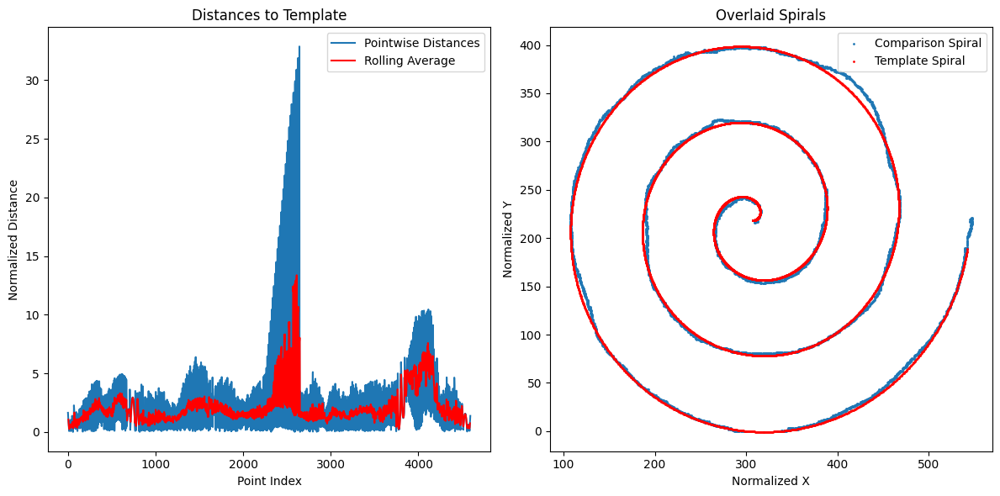

/Users/linusfalk/Dev/Advanced_image_analysis/data/control2.tiff
the mean distance from template 1.9183872338358405 and variance 3.5378685366557203


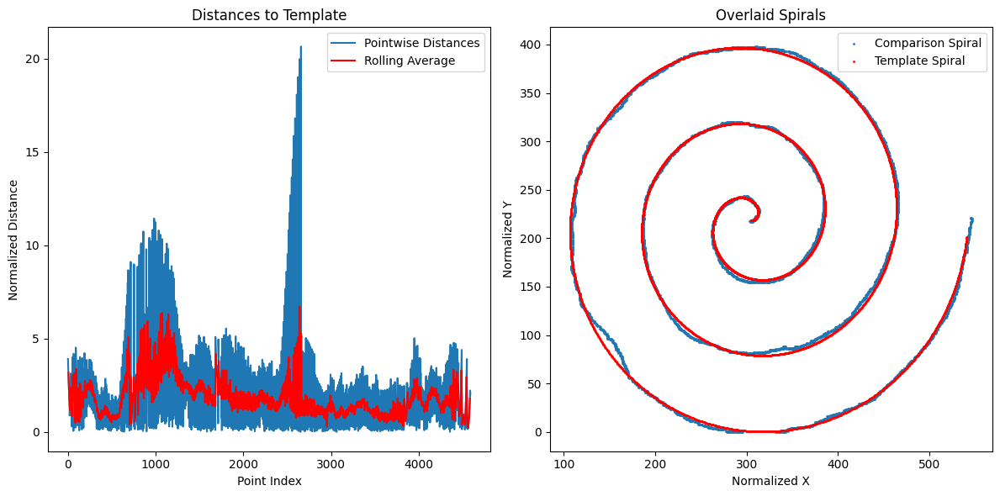

/Users/linusfalk/Dev/Advanced_image_analysis/data/control3.tiff
the mean distance from template 20.63365573694566 and variance 747.8006428397622


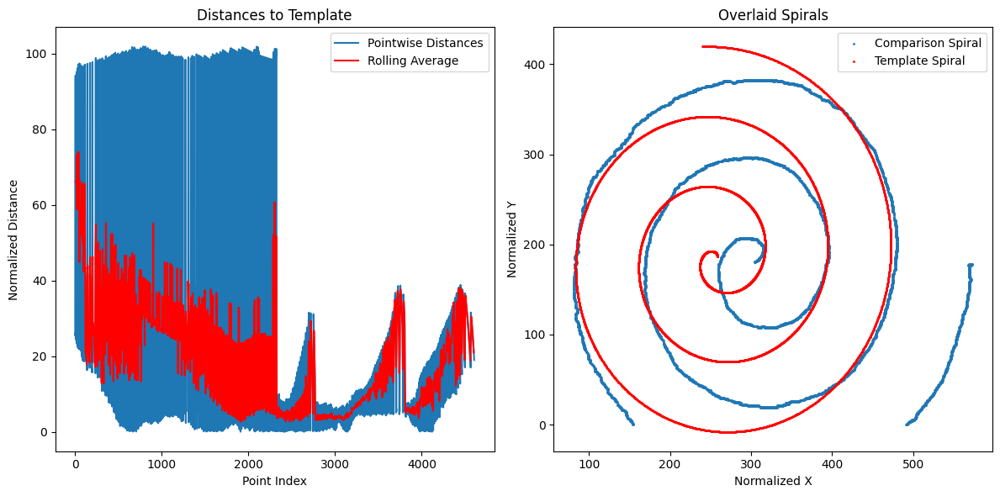

/Users/linusfalk/Dev/Advanced_image_analysis/data/control4.tiff
the mean distance from template 1.9743538776846148 and variance 2.3895184941359906


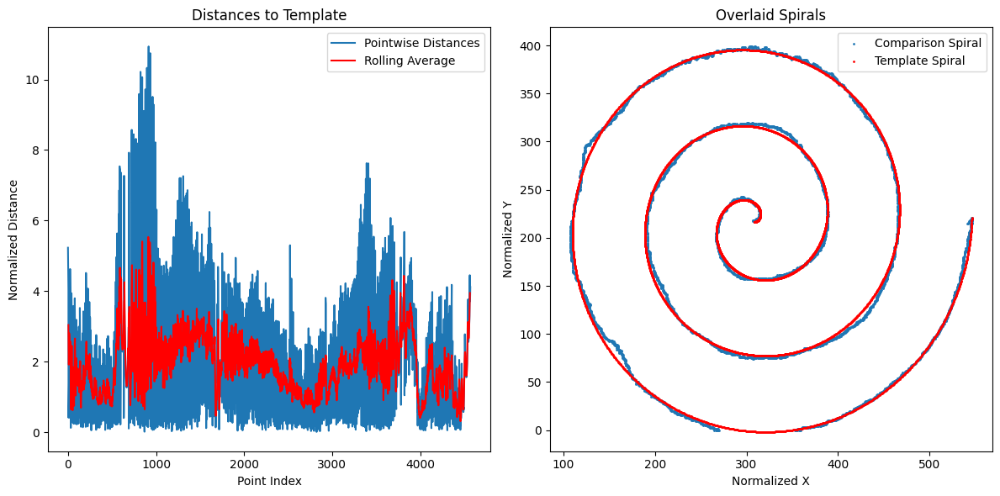

/Users/linusfalk/Dev/Advanced_image_analysis/data/control5.tiff
the mean distance from template 2.707516266108969 and variance 3.9375989353372445


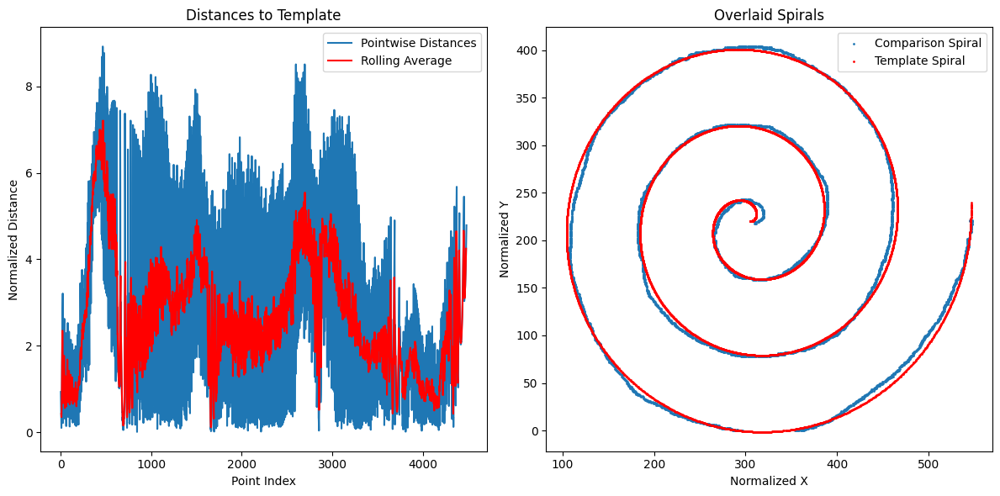

/Users/linusfalk/Dev/Advanced_image_analysis/data/control6.tiff
the mean distance from template 1.8410193841432545 and variance 1.843003530756178


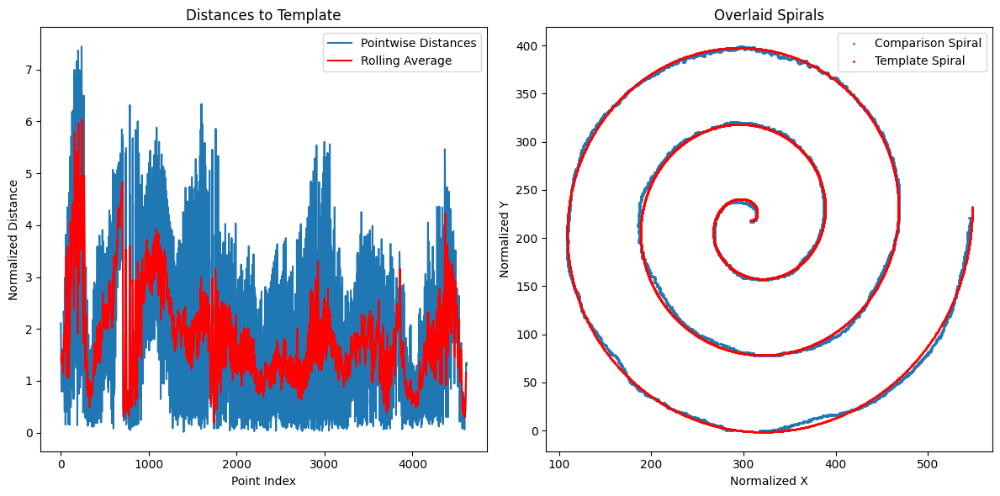

/Users/linusfalk/Dev/Advanced_image_analysis/data/control7.tiff
the mean distance from template 2.626419940344408 and variance 3.2398336790134605


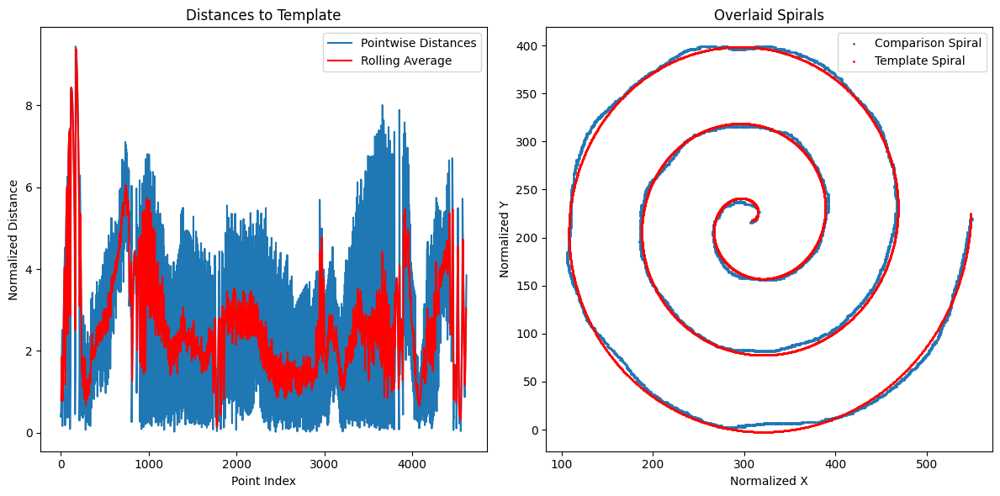

/Users/linusfalk/Dev/Advanced_image_analysis/data/control8.tiff
the mean distance from template 1.6546014423919135 and variance 1.5159801929447103


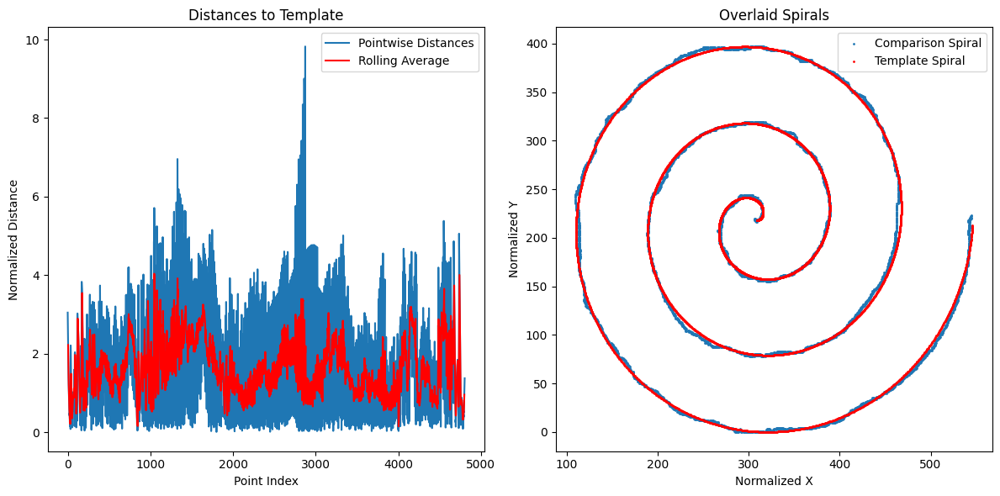

/Users/linusfalk/Dev/Advanced_image_analysis/data/control9.tiff
the mean distance from template 1.255464675525175 and variance 0.895457649041012


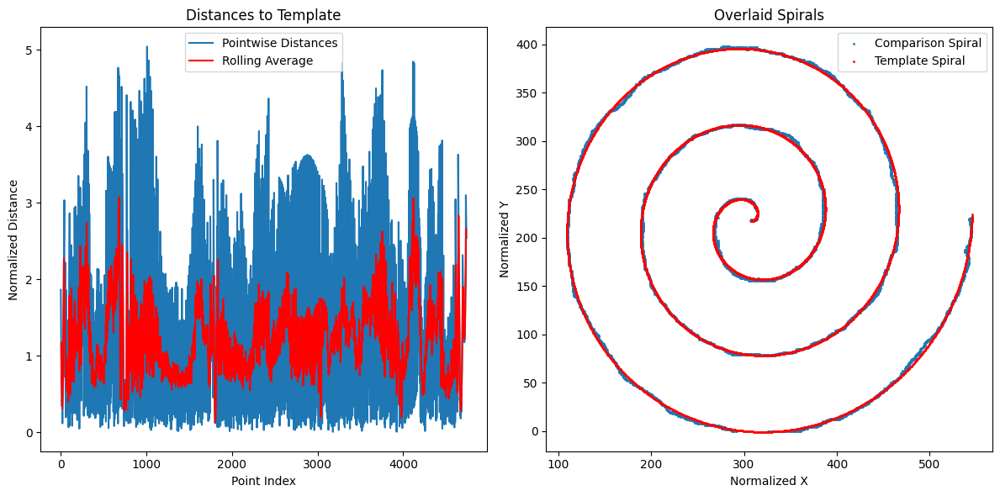

/Users/linusfalk/Dev/Advanced_image_analysis/data/control10.tiff
the mean distance from template 3.30050327702094 and variance 5.755688247836055


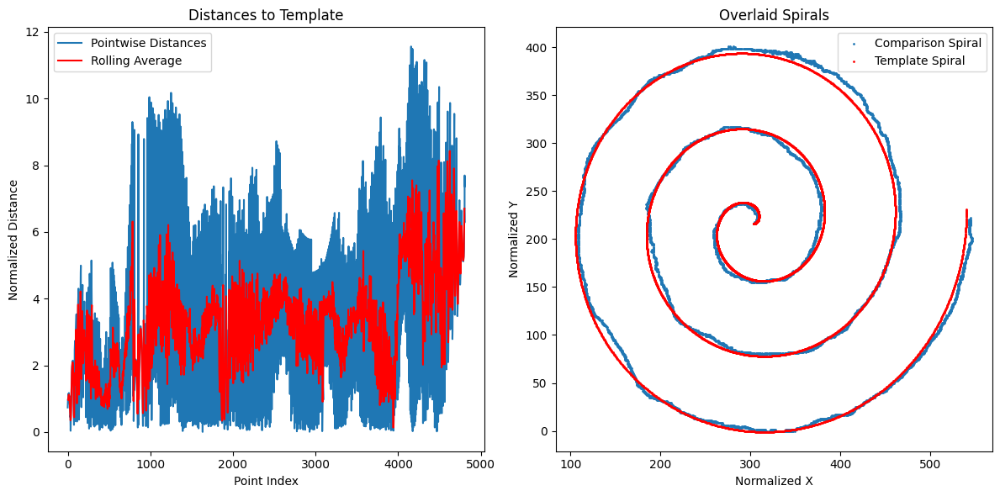

/Users/linusfalk/Dev/Advanced_image_analysis/data/control11.tiff
the mean distance from template 2.0301643678384296 and variance 2.6032544625538017


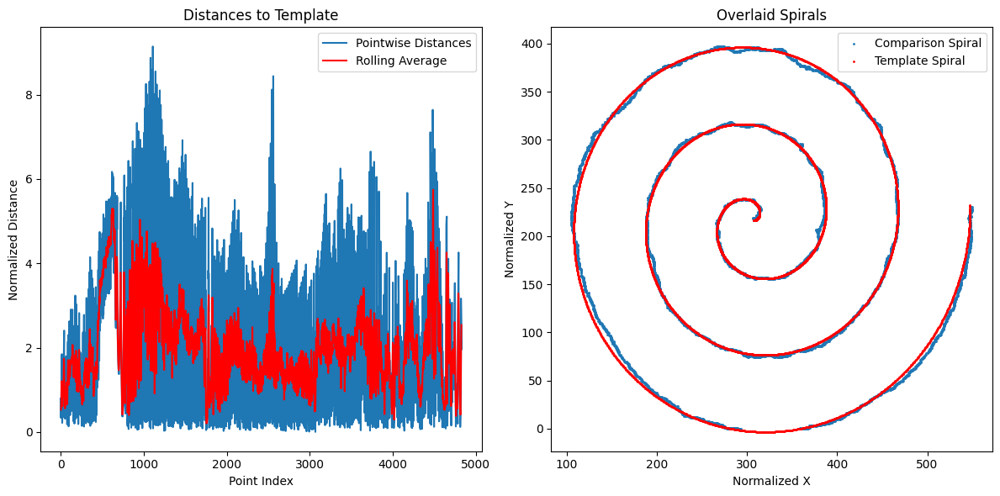

/Users/linusfalk/Dev/Advanced_image_analysis/data/control12.tiff
the mean distance from template 4.424859868408365 and variance 13.744344509421845


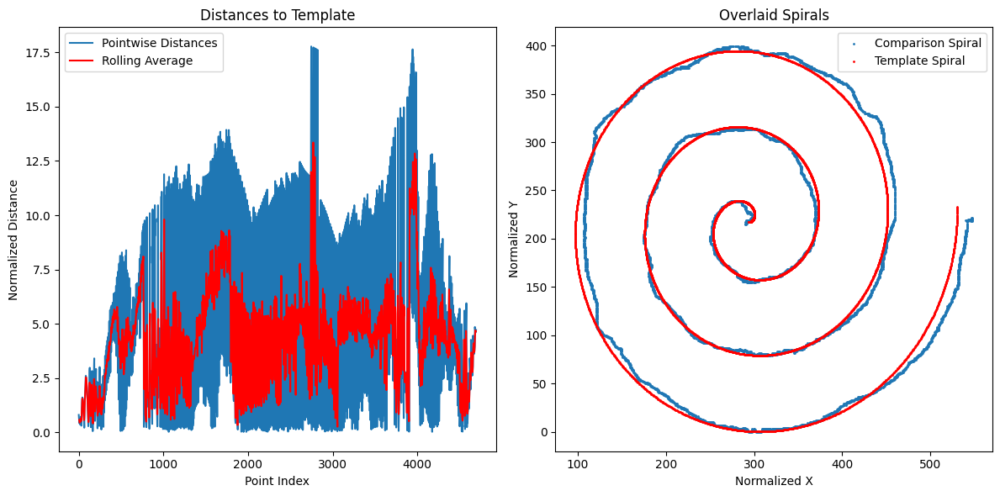

/Users/linusfalk/Dev/Advanced_image_analysis/data/control13.tiff
the mean distance from template 4.18874929169607 and variance 14.324070010748155


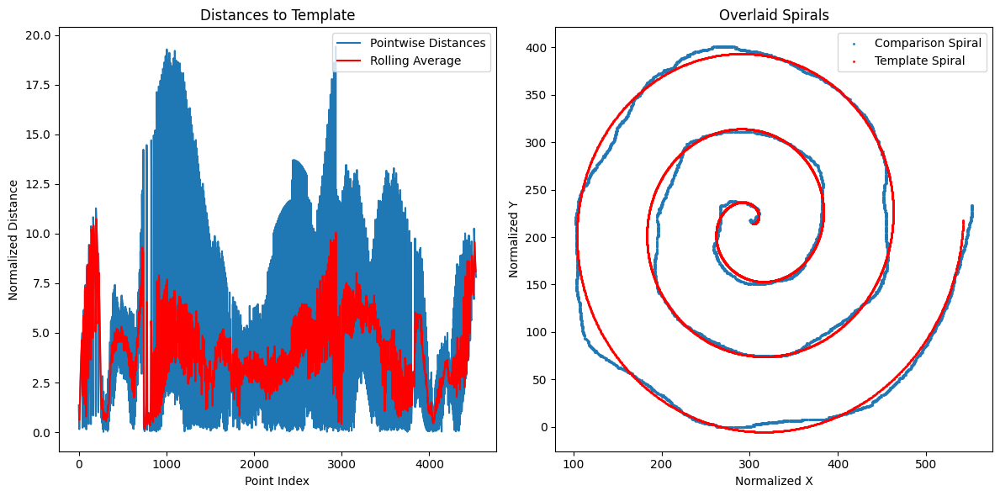

/Users/linusfalk/Dev/Advanced_image_analysis/data/control14.tiff
the mean distance from template 4.722497713702072 and variance 62.349510969327476


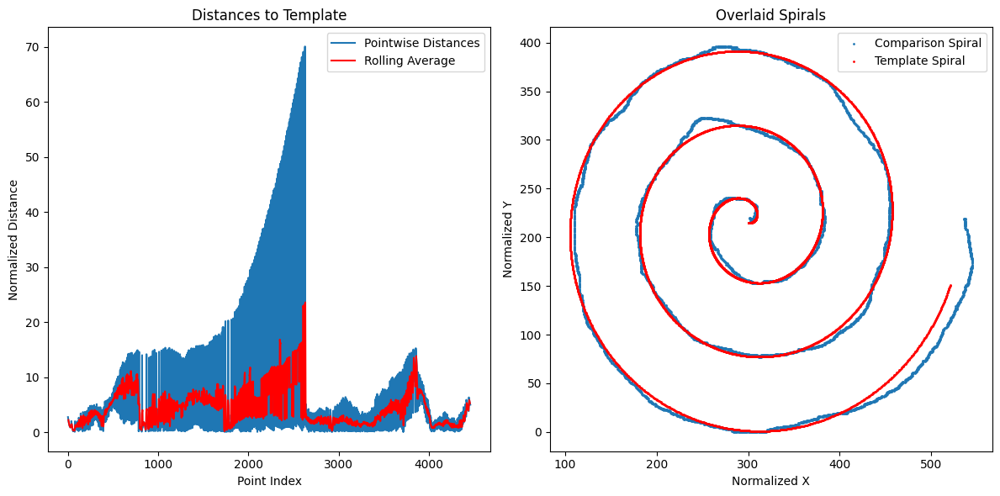

/Users/linusfalk/Dev/Advanced_image_analysis/data/control15.tiff
the mean distance from template 5.366878637077339 and variance 14.045819103969814


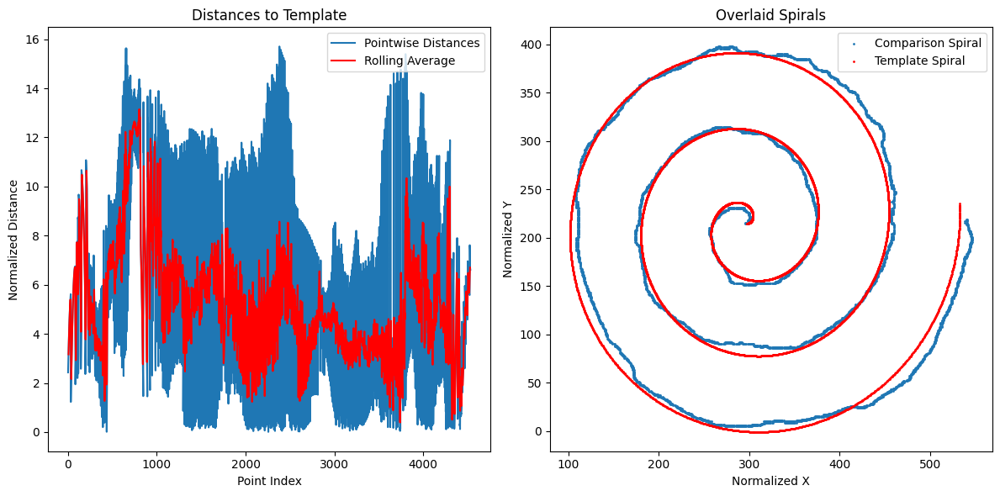

4.057129728705679
80.21149012357016


In [22]:
path = '/Users/linusfalk/Dev/Advanced_image_analysis/data/'
file_list = [f"{path}control{i}.tiff" for i in range(1, 16)]
result = []
result_tot1 = []
for filepath in file_list:
    print(filepath) 
    tot_dist, dist, mean, var = optimize(filepath, plot=True)
    result.append(np.array(dist))
    result_tot1.append(tot_dist)


means1 = []
variances1 = []
for arr in result:
    means1.append(np.mean(arr))
    variances1.append(np.var(arr))

# Calculate overall mean and variance
overall_mean = np.mean(means1)
overall_variance = np.mean(variances1) + np.var(means1)

print(overall_mean)
print(overall_variance)

mean1 = np.mean(np.array(result_tot1))
std1 = np.sqrt(np.var(np.array(result_tot1)))

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson1.tiff
the mean distance from template 93.81591571508602 and variance 5632.179321899249


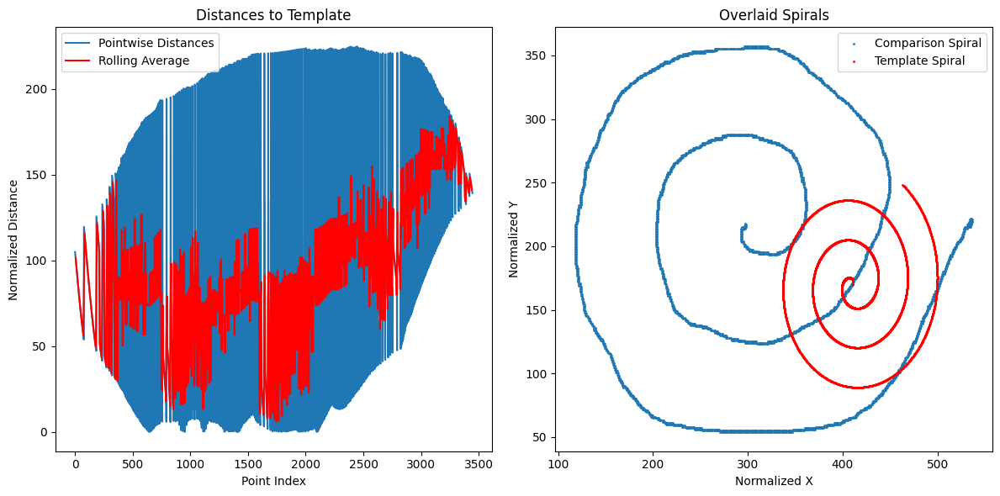

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson2.tiff
the mean distance from template 4.709268043253491 and variance 10.682115522567106


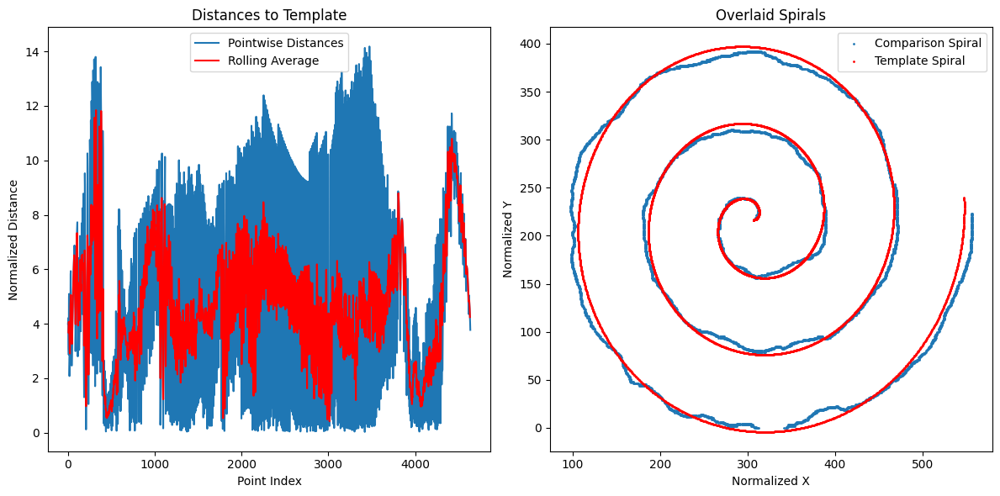

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson3.tiff
the mean distance from template 5.6556958138738365 and variance 21.979763609897727


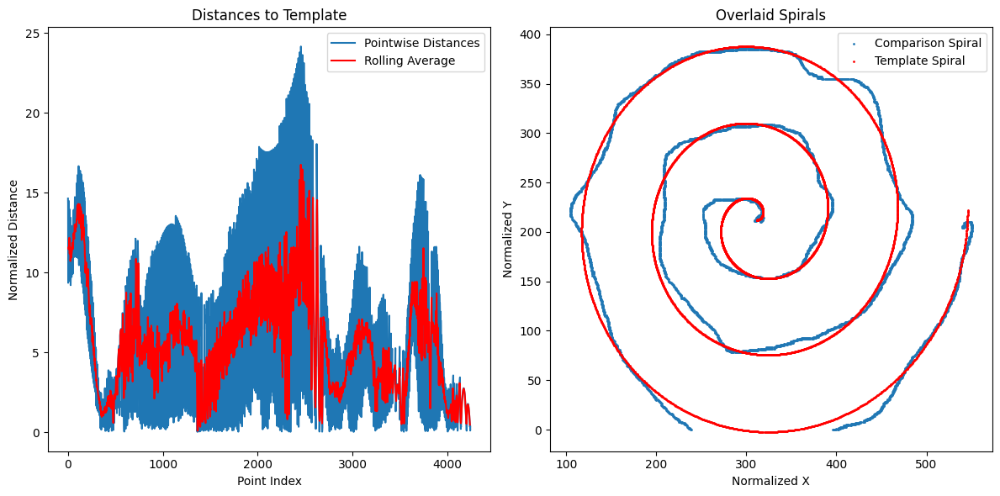

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson4.tiff
the mean distance from template 2.2675559201565876 and variance 3.97617431503644


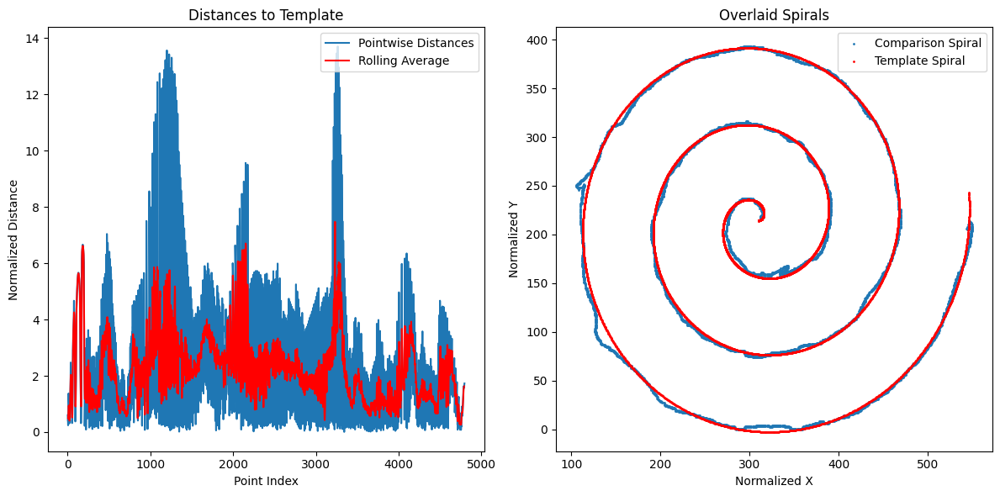

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson5.tiff
the mean distance from template 4.761846699465992 and variance 19.004640893145417


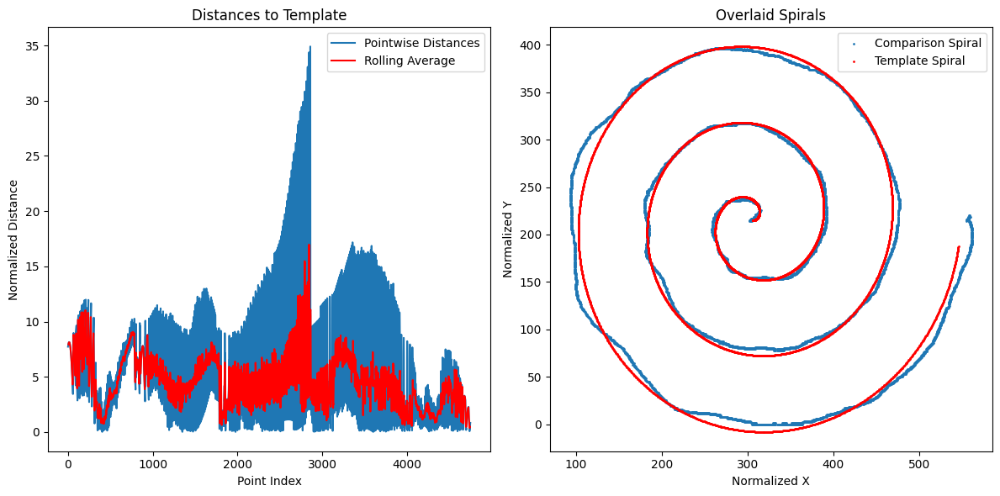

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson6.tiff
the mean distance from template 3.8851568520818573 and variance 7.54629770517615


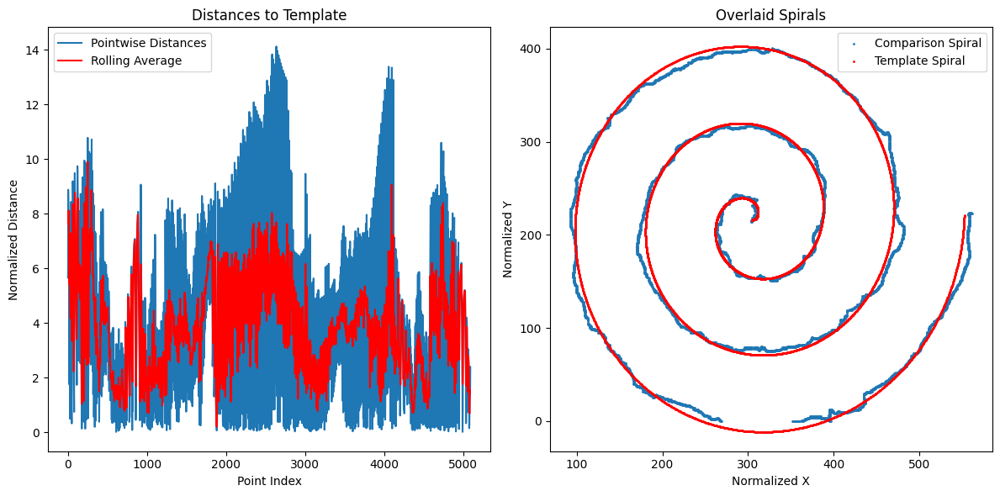

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson7.tiff
the mean distance from template 7.93590077822801 and variance 45.730498683374364


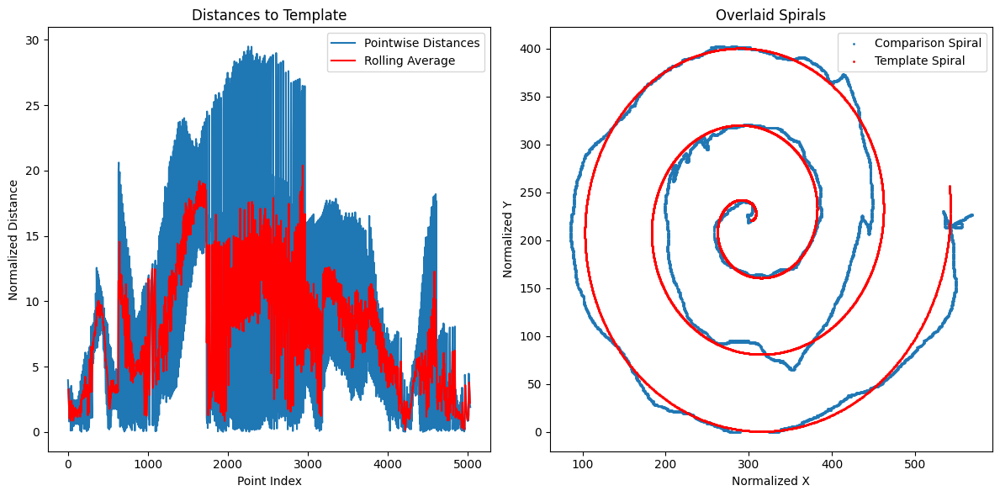

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson8.tiff
the mean distance from template 2.9180414956452805 and variance 5.079631608336972


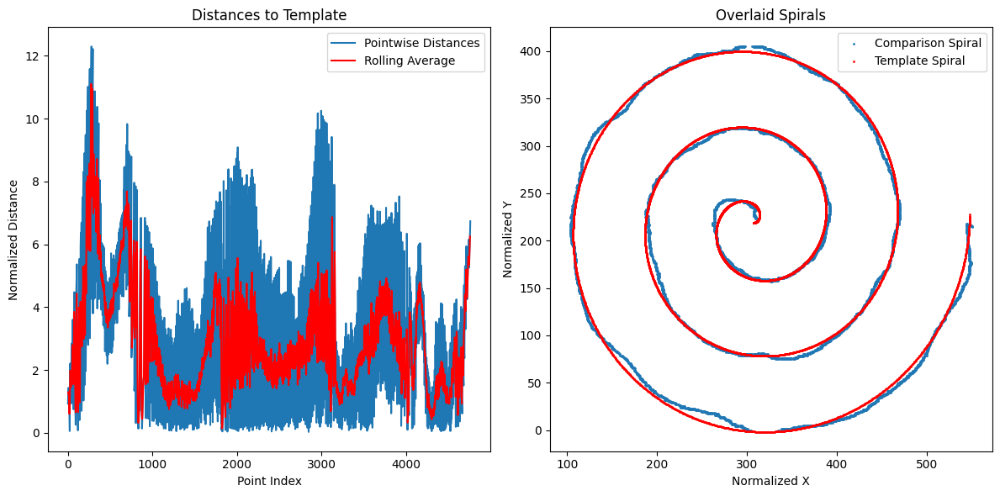

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson9.tiff
the mean distance from template 3.666007081355596 and variance 11.734050948338332


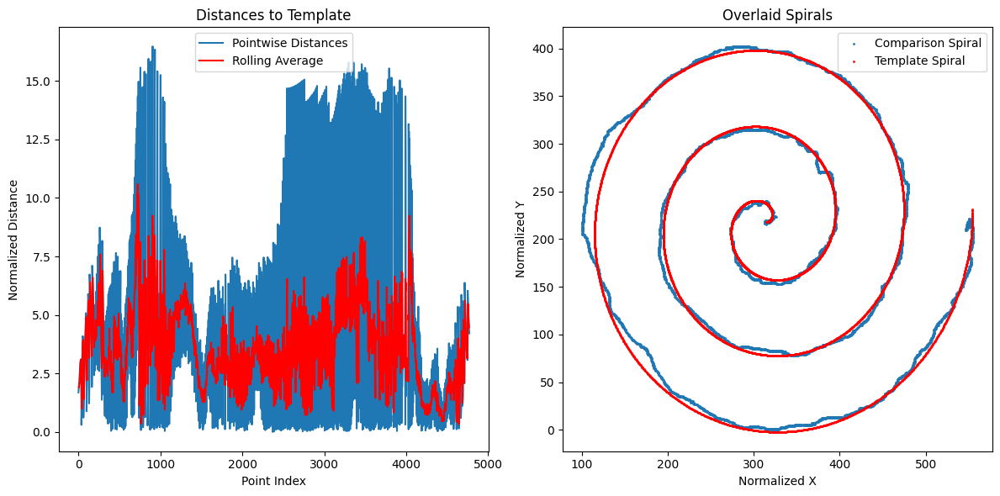

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson10.tiff
the mean distance from template 6.323370075273226 and variance 145.2796408753049


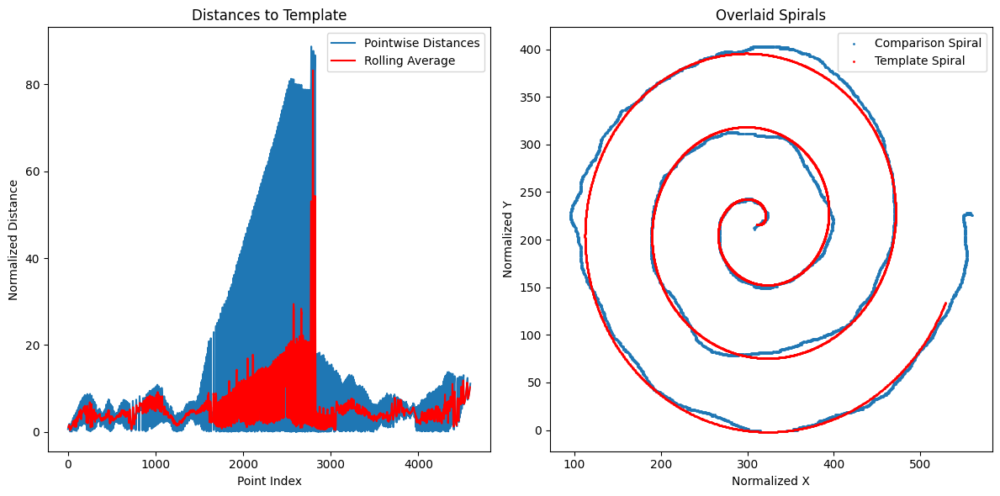

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson11.tiff
the mean distance from template 162.99397871410247 and variance 6546.726085235431


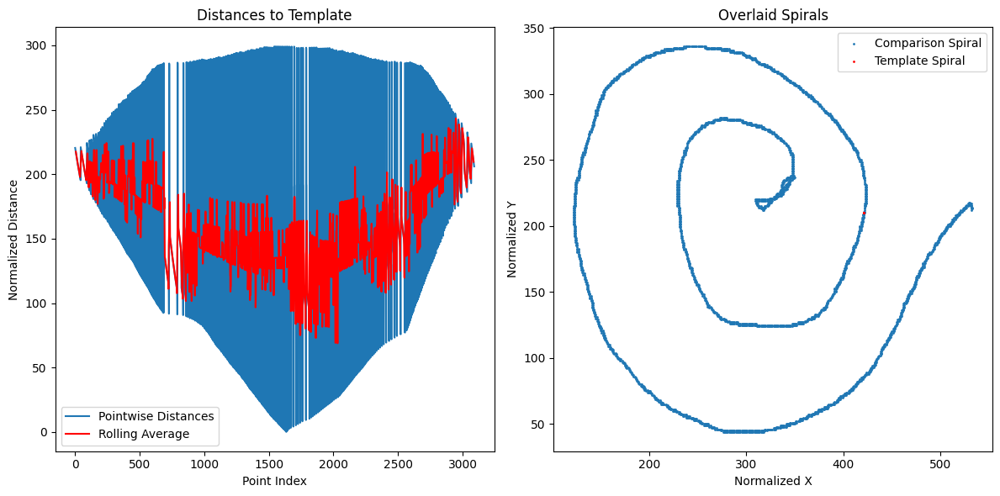

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson12.tiff
the mean distance from template 7.387697003751659 and variance 182.35827270016236


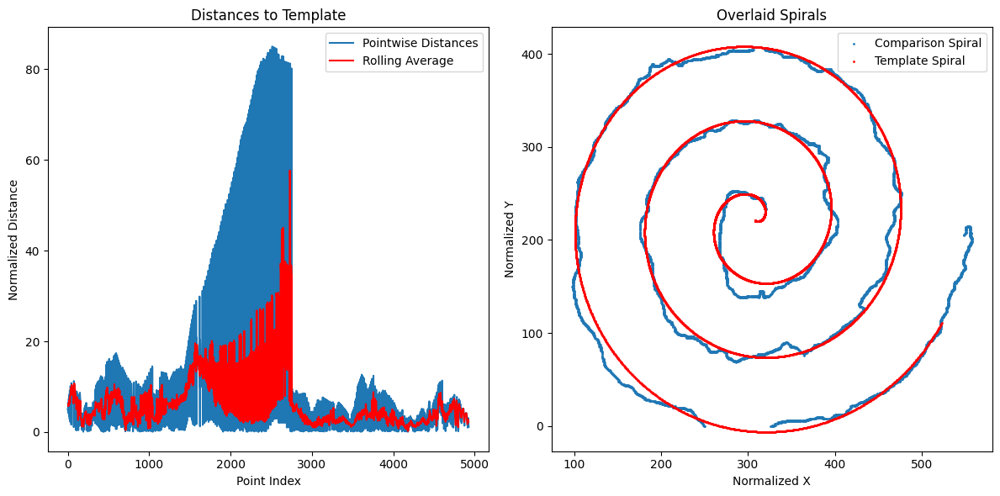

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson13.tiff
the mean distance from template 6.167249604326903 and variance 22.121257312892986


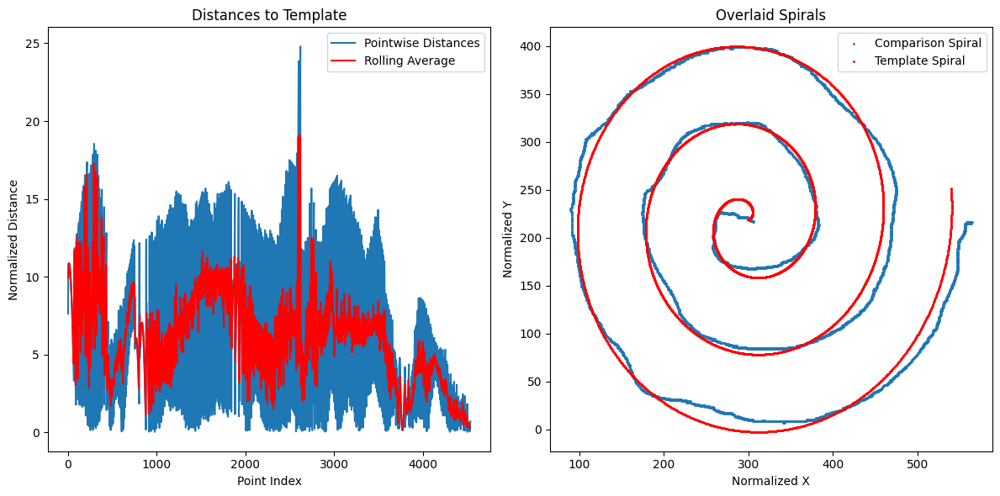

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson14.tiff
the mean distance from template 6.132046651911819 and variance 28.433275804003742


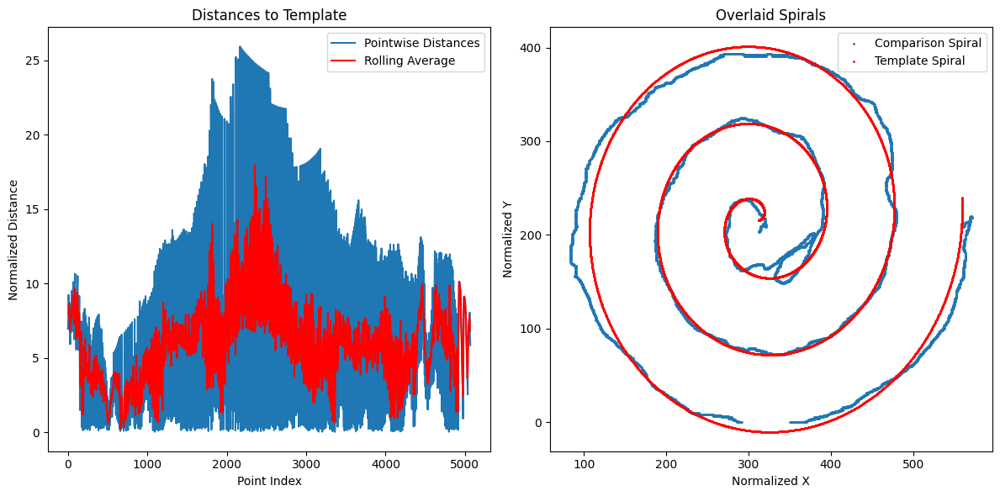

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson15.tiff
the mean distance from template 3.702472474789538 and variance 27.724586103678156


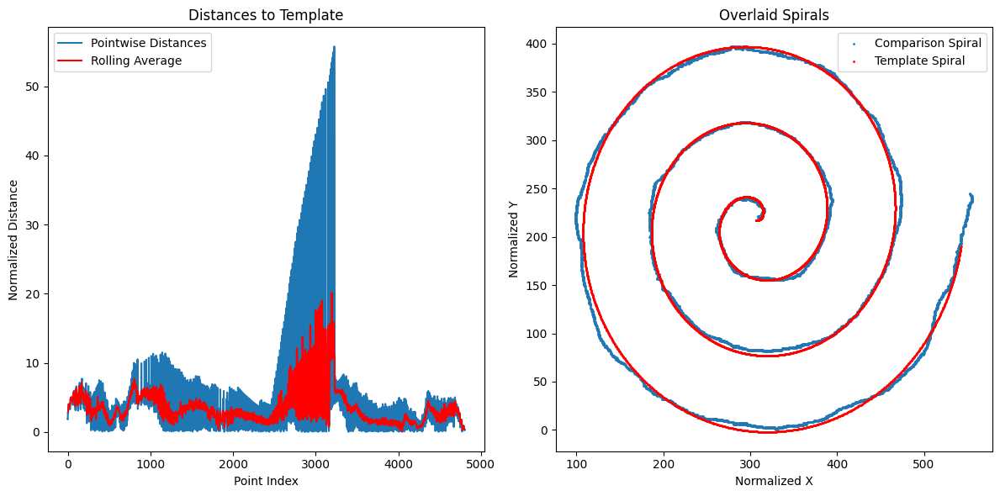

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson16.tiff
the mean distance from template 4.491583862726928 and variance 13.22215884514668


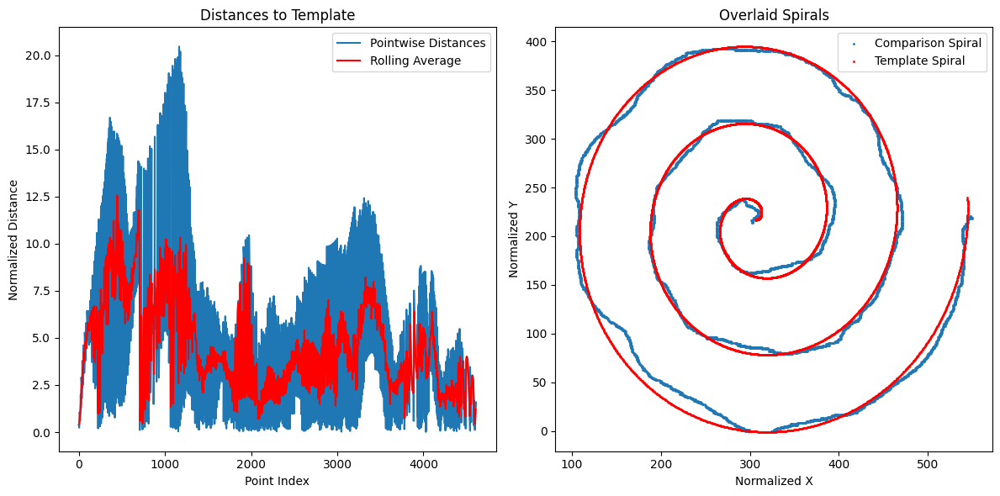

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson17.tiff
the mean distance from template 27.33105202144429 and variance 649.3974411301901


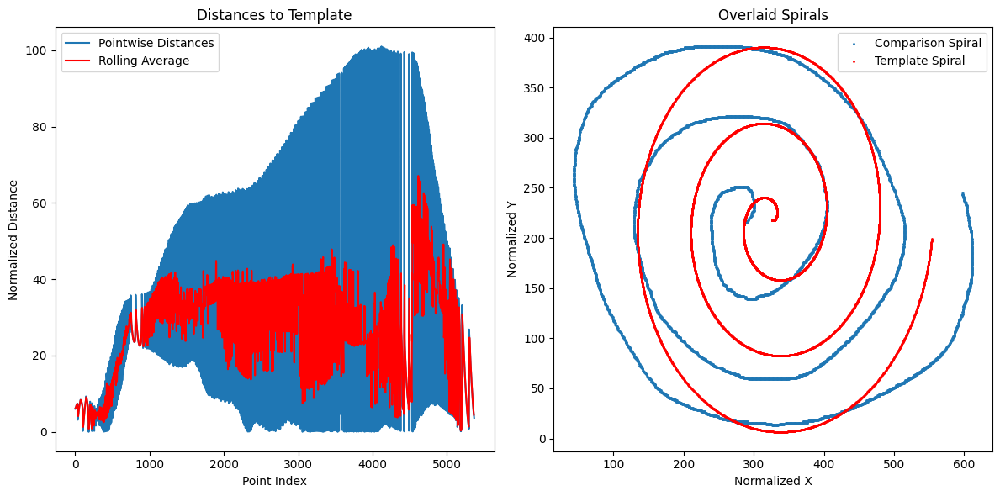

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson18.tiff
the mean distance from template 21.97806967858884 and variance 661.0642337855912


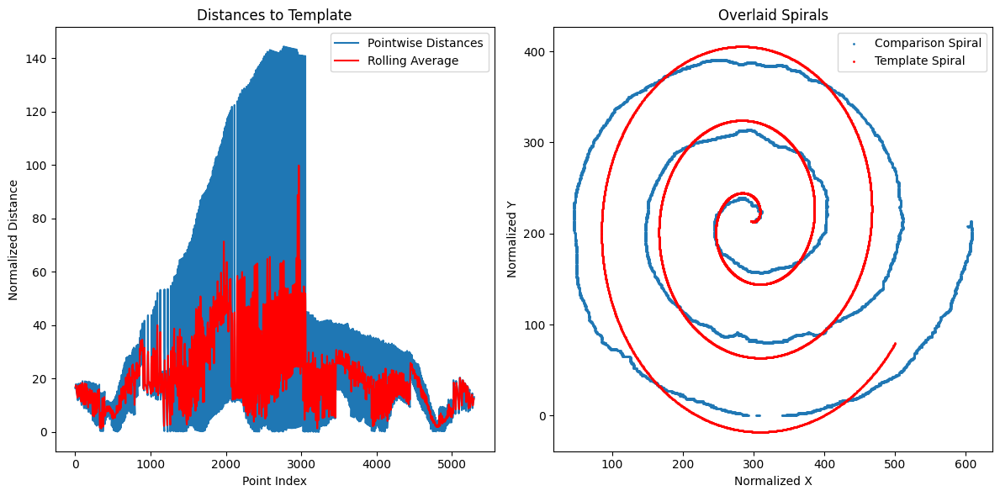

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson19.tiff
the mean distance from template 24.499505977302693 and variance 786.7838160446506


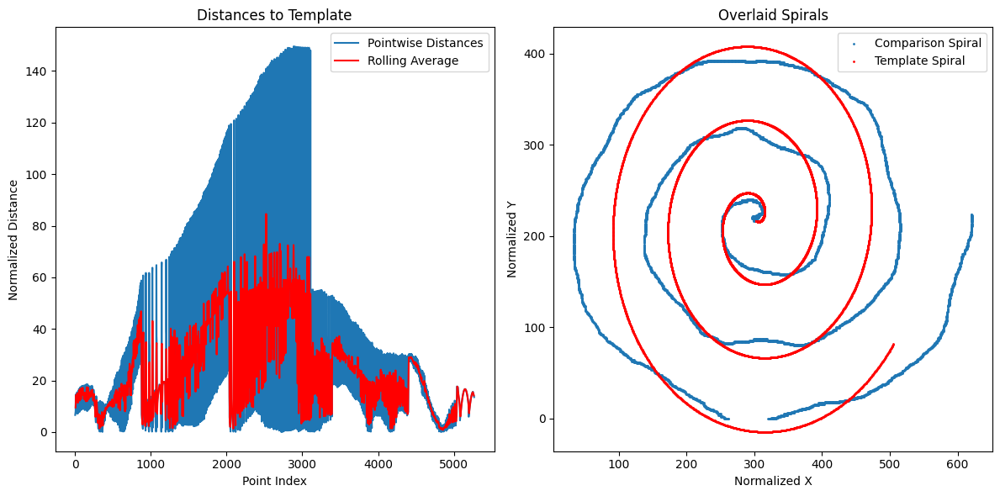

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson20.tiff
the mean distance from template 24.153686199511867 and variance 655.5671775042028


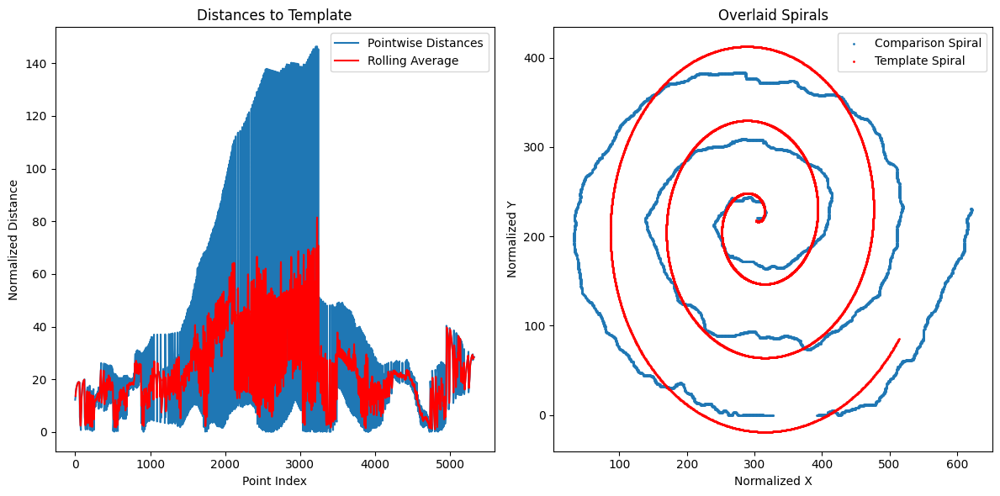

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson21.tiff
the mean distance from template 23.456797677903737 and variance 727.992595883454


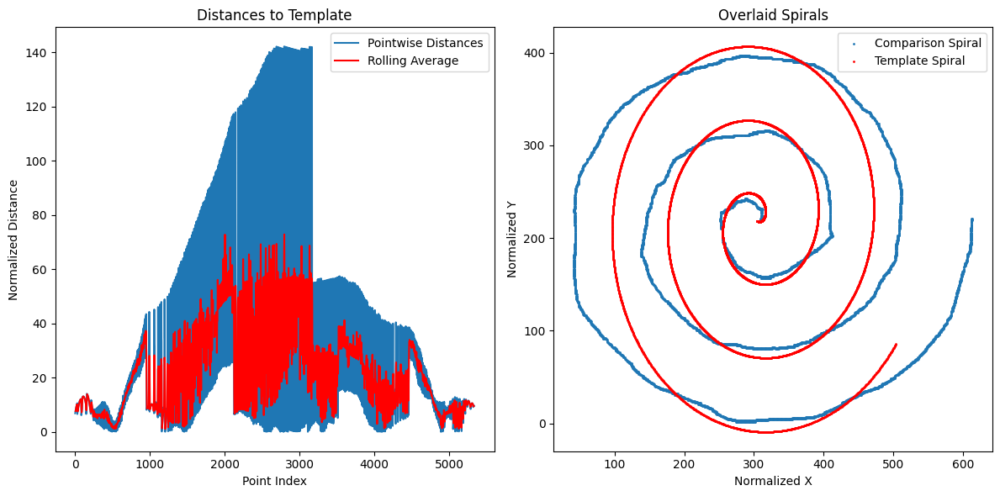

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson22.tiff
the mean distance from template 3.735546017173469 and variance 10.058411900387556


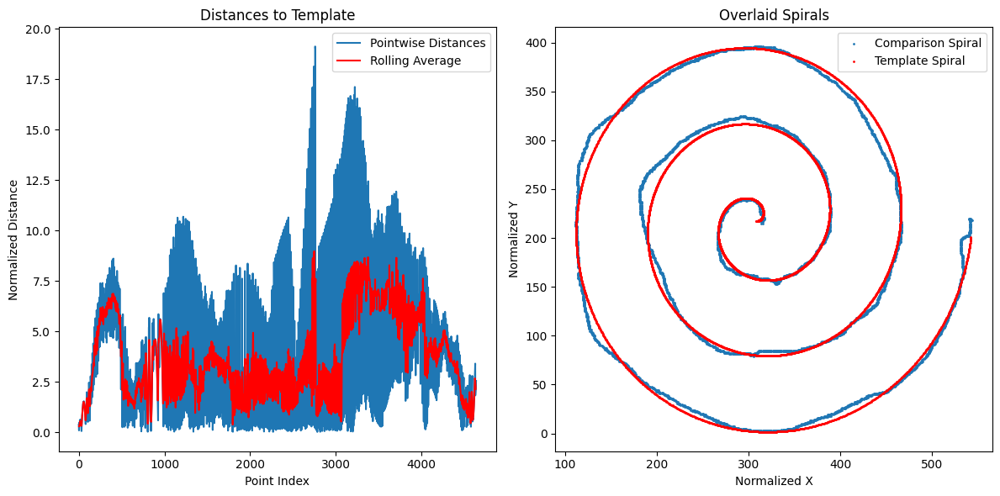

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson23.tiff
the mean distance from template 7.43852270923597 and variance 31.161272841827433


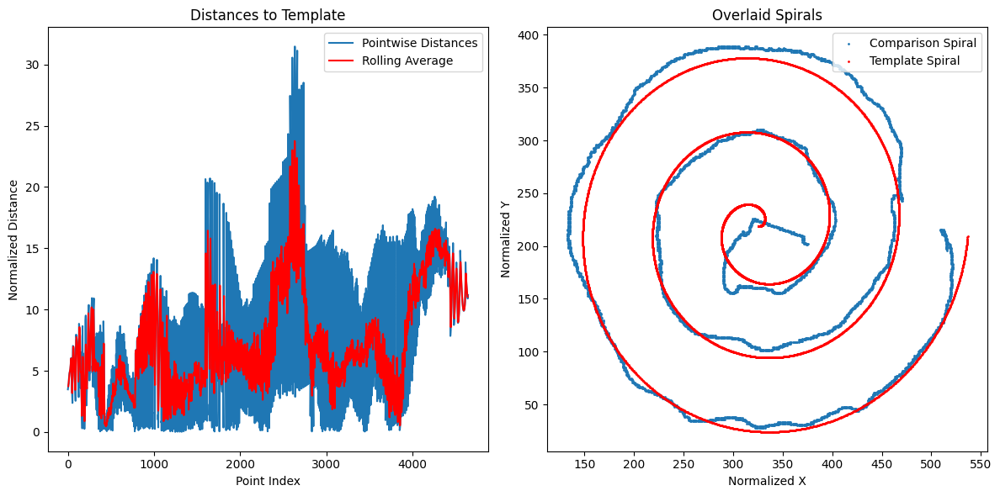

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson24.tiff
the mean distance from template 5.400764410466841 and variance 118.96254025039657


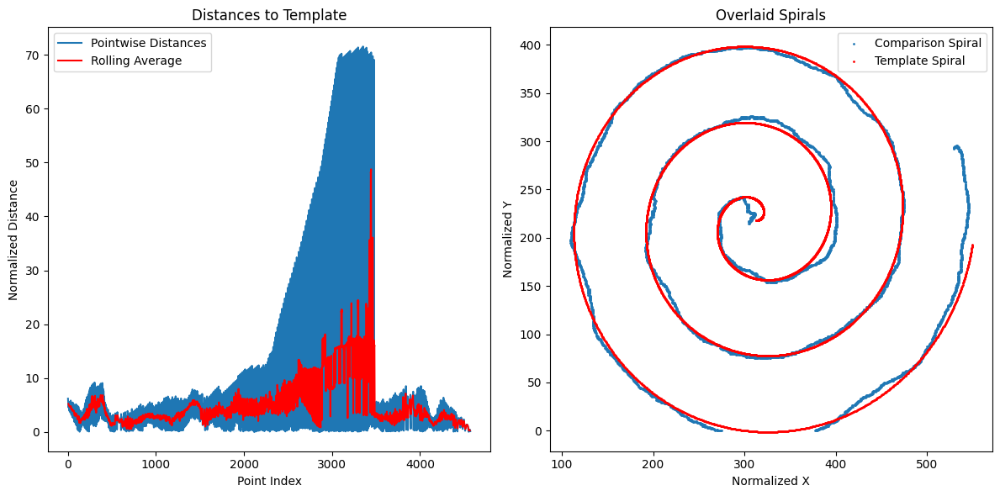

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson25.tiff
the mean distance from template 2.887562362058844 and variance 4.7460704616181655


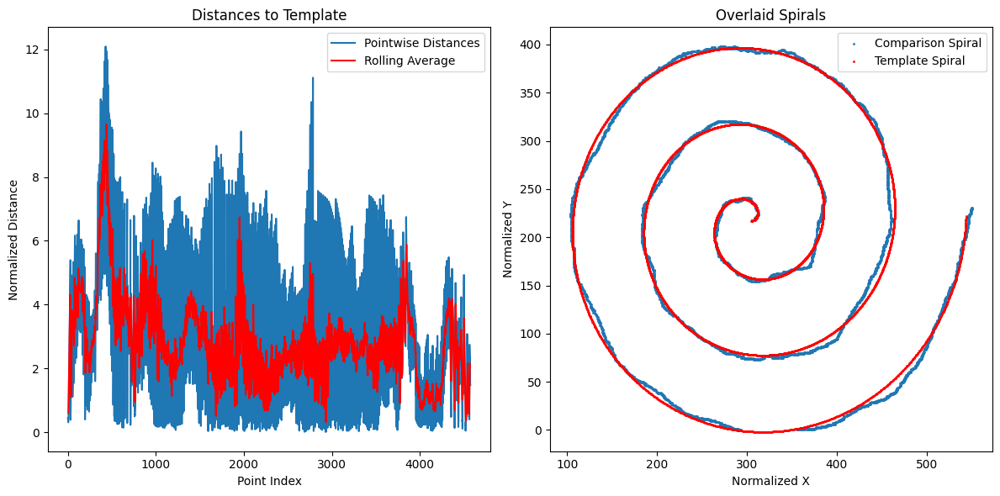

18.70781175358863
1857.806884490714


In [23]:
path = '/Users/linusfalk/Dev/Advanced_image_analysis/data/'
file_list = [f"{path}parkinson{i}.tiff" for i in range(1, 26)]
result = []
result_tot2 = []
for filepath in file_list: 
    print(filepath) 
    tot_dist, dist, mean, var = optimize(filepath, plot=True)
    result.append(np.array(dist))
    result_tot2.append(tot_dist)



means2 = []
variances2 = []
for arr in result:
    means2.append(np.mean(arr))
    variances2.append(np.var(arr))

# Calculate overall mean and variance
overall_mean = np.mean(means2)
overall_variance = np.mean(variances2) + np.var(means2)

print(overall_mean)
print(overall_variance)





In [24]:
control_mean1 = [2.190911730793024,	
1.8677182021058591,
20.63365573694566,	
1.9743567521447742,	
2.6405767375739027,	
1.839829001643046,	
2.615840180584348,	
1.6497808105450502,
1.25620274498876,
3.3101502308750765,	
2.0281639444335475,
4.444482465152881,	
4.165370868552128,
4.624652260285363,	
5.362540987206639]

control_var1 = [7.711878817067361,
2.798969839373198,
747.8006428397622,
2.380891846324751,
3.926268308458816,
1.844061129125334,
3.243855967539395,
1.486272446721974,
0.891858247303669,
5.777285985581656,
2.600252885697458,
14.29521820610784,
13.99896975049098,
55.26162764525036,
14.054607320525,
]

control_mean2 = [
4.990114392992495,
3.865135721527857,
4.528175578939824,
4.142916274588255,
5.729688930247503,
6.201356686399298,
7.634052158947891,
2.7030107519241424,
1.8685697811456123,
2.738343338854417,
2.3871530345454612,
6.778646355746205,
7.959706683243856,
6.787210665570264,
3.827167088245468
]

control_var2 = [
13.37862114966543,
8.555653410691818,
18.59444888617648,
9.560681170695075,
26.29112441926876,
30.34207543523233,
101.8790001648942,
5.134959300088718,
2.302741255065638,
5.282239303888708,
3.972046900649604,
41.53969316254043,
218.4419410687310,
141.8093751799198,
9.972095404376443,
]


parkinson_mean1 = [93.81591571508602,
4.705440400732464,
5.6556958138738365,
2.277302787509331,
4.932074653233026,
3.9081476693409707,
7.94314721312205,
2.9028611152677293,
3.642191863848754,
6.292025373638194,
162.99397870617625,
7.193239389927992,
6.174540610438547,
6.132195481750243,
3.6749336008290507,
4.497364513564422,
27.313186234827864,
21.336189644352586,
24.499627202538264,
21.657157923796287,
23.405447463851083,
3.8906364304257366,
7.441475439605717,
5.1759515027536205,
2.8967994110652655,
]

parkinson_var1 = [
5632.17932189924,
10.6720491705180,
21.9797636098977,
4.04671261092550,
26.8091955608019,
7.84118936765390,
45.7109481089160,
5.19329887219327,
11.9909062913855,
142.937712098366,
6546.72608492094,
167.087733752272,
22.2268300409057,
28.4329299915695,
26.0858360528835,
13.3211526348391,
648.164253852848,
584.030842002354,
786.874601070205,
413.223073774226,
722.351850185855,
14.4853740420993,
31.4456759667423,
101.059393576169,
4.83986697165863,
]


parkinson_mean2 = [
    167.5491304901574,
7.053324183960731,
5.671515750001368,
139.59185344715198,
5.141603936013607,
5.969625552352736,
186.7464061618813,
19.558231189986945,
13.268684275781927,
35.40196454061012,
144.34784696059677,
149.29183246340773,
12.571573786129079,
6.365267472095278,
10.300768228950984,
144.48009587002372,
20.563295278283295,
19.953892890824534,
224.87562616151658,
25.31859238039134,
17.914138610023812,
5.2634423933624745,
162.55627330780626,
7.32454006275767,
7.122175270670148
]

parkinson_var2 = [
6644.61019385850,
46.0791988244085,
16.6618861479408,
2967.83904972561,
13.3638078746554,
17.1387817867623,
8090.13044466649,
706.305780956983,
80.8995629780430,
1408.84272627647,
3120.90977703193,
5031.41739743101,
332.929563834393,
26.6735263378086,
98.0647101275340,
5933.48426913977,
481.629289890624,
645.741634378089,
12161.7475263393,
1307.10435988070,
185.548632514526,
15.3722439000784,
5897.31065435943,
30.5223751589145,
31.5049069418335
]


data = [control_mean1, control_var1, control_mean2, control_var2, ]




In [25]:
'''mean_plot1 = np.mean(var1)
mean_plot2 = np.mean(var2)

std1 = np.sqrt(np.var(var1))
std2 = np.sqrt(np.var(var2))

x = np.linspace(min(mean_plot1 - 3*std1, mean_plot2 - 3*std2), max(mean_plot1 + 3*std1, mean_plot2 + 3*std2), 1000)

y1 = scipy.stats.norm.pdf(x, mean_plot1, std1)
y2 = scipy.stats.norm.pdf(x, mean_plot2, std2)


plt.plot(x,y1)
plt.plot(x,y2)
plt.scatter(var1, np.zeros(len(var1)))
plt.scatter(var2, np.zeros(len(var2)))
plt.show()

threshold = 5.4

count_over_threshold = len([value for value in var1 if value < threshold])
print(f'{count_over_threshold} of {len(var1)}' )

count_over_threshold = len([value for value in var2 if value > threshold])
print(count_over_threshold)
print(f'{count_over_threshold} of {len(var2)}' )'''

"mean_plot1 = np.mean(var1)\nmean_plot2 = np.mean(var2)\n\nstd1 = np.sqrt(np.var(var1))\nstd2 = np.sqrt(np.var(var2))\n\nx = np.linspace(min(mean_plot1 - 3*std1, mean_plot2 - 3*std2), max(mean_plot1 + 3*std1, mean_plot2 + 3*std2), 1000)\n\ny1 = scipy.stats.norm.pdf(x, mean_plot1, std1)\ny2 = scipy.stats.norm.pdf(x, mean_plot2, std2)\n\n\nplt.plot(x,y1)\nplt.plot(x,y2)\nplt.scatter(var1, np.zeros(len(var1)))\nplt.scatter(var2, np.zeros(len(var2)))\nplt.show()\n\nthreshold = 5.4\n\ncount_over_threshold = len([value for value in var1 if value < threshold])\nprint(f'{count_over_threshold} of {len(var1)}' )\n\ncount_over_threshold = len([value for value in var2 if value > threshold])\nprint(count_over_threshold)\nprint(f'{count_over_threshold} of {len(var2)}' )"

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic1.tiff
the mean distance from template 4.990819028948447 and variance 13.364212594846645


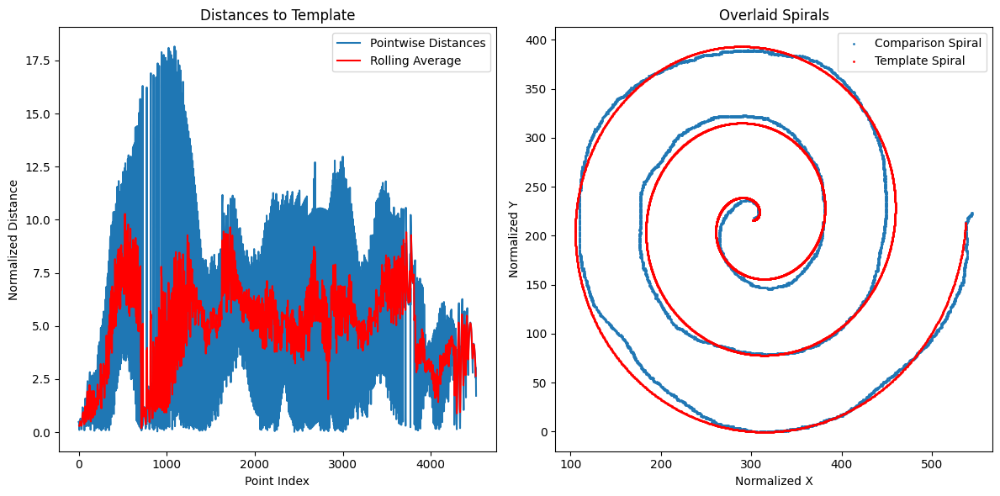

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic2.tiff
the mean distance from template 3.865806880369014 and variance 8.568690513788793


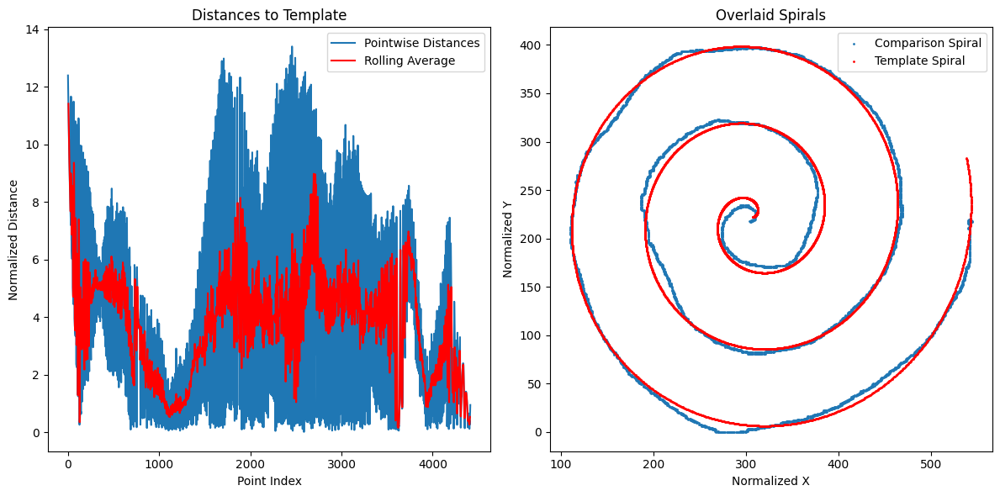

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic3.tiff
the mean distance from template 4.5252655652795895 and variance 18.587395797827376


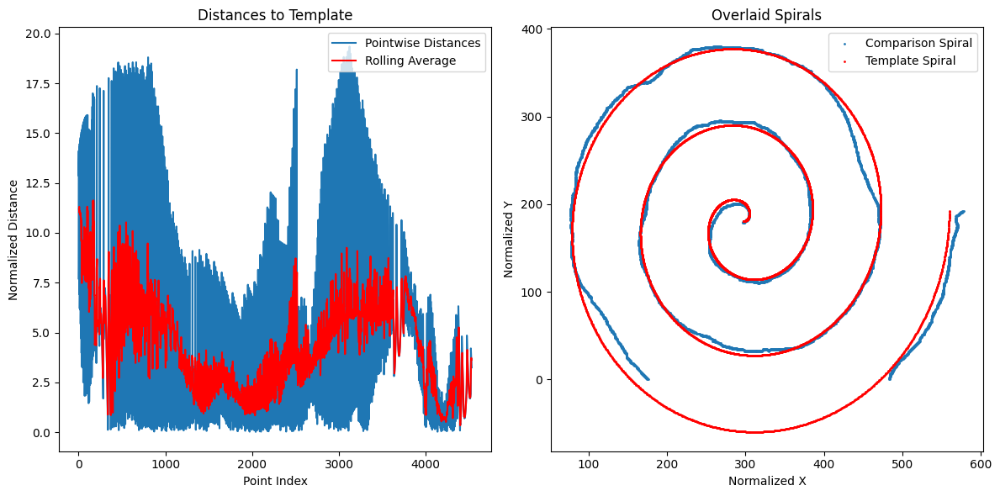

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic4.tiff
the mean distance from template 4.1424453875587 and variance 9.548242116586751


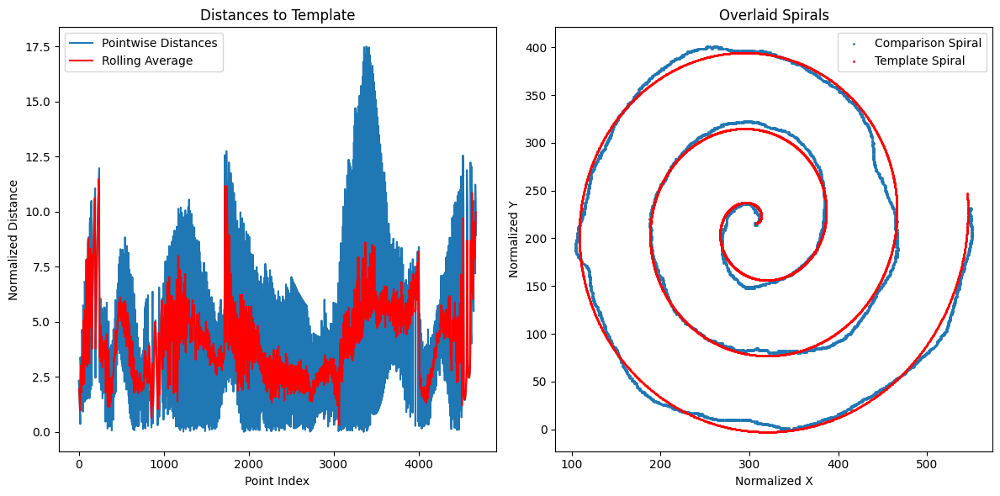

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic5.tiff
the mean distance from template 5.7470229933969 and variance 27.00440832332236


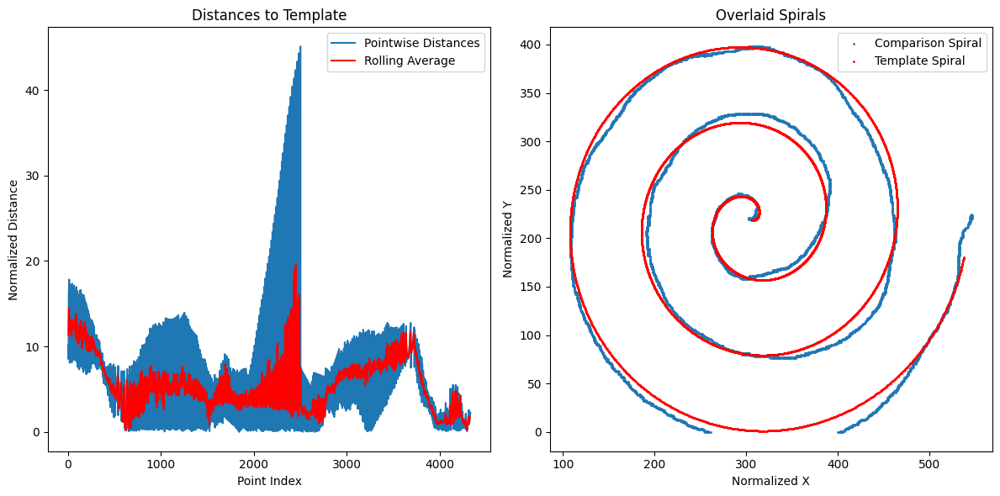

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic6.tiff
the mean distance from template 6.202789728881098 and variance 30.30097504056627


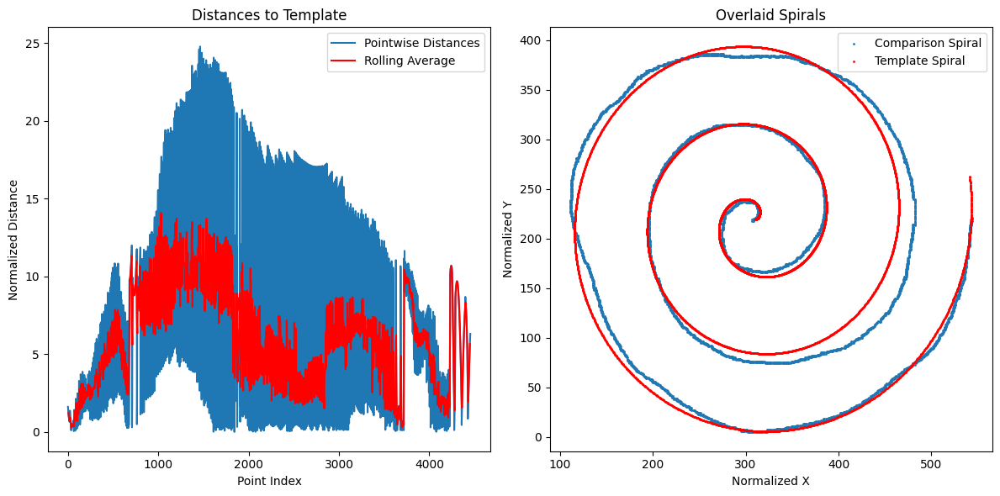

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic7.tiff
the mean distance from template 7.43044762961522 and variance 86.91214824191687


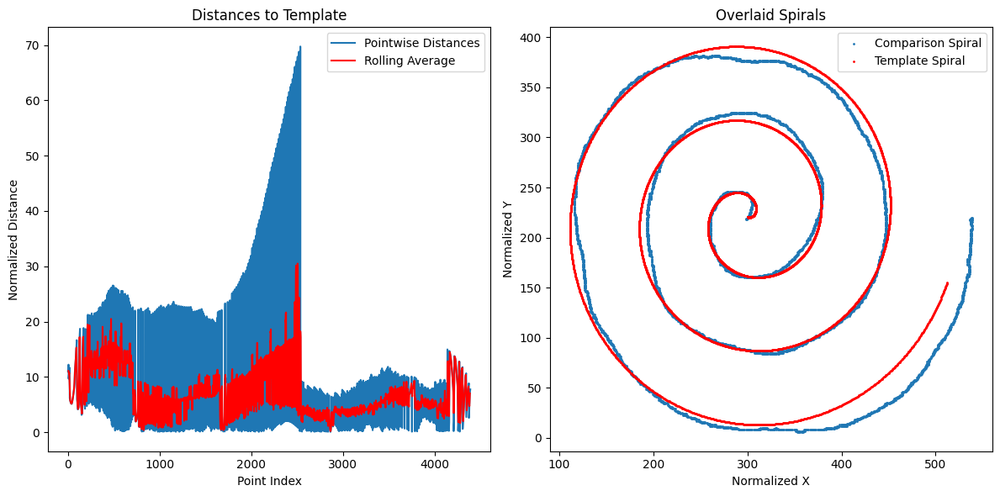

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic8.tiff
the mean distance from template 2.7049899918899625 and variance 5.104306589443031


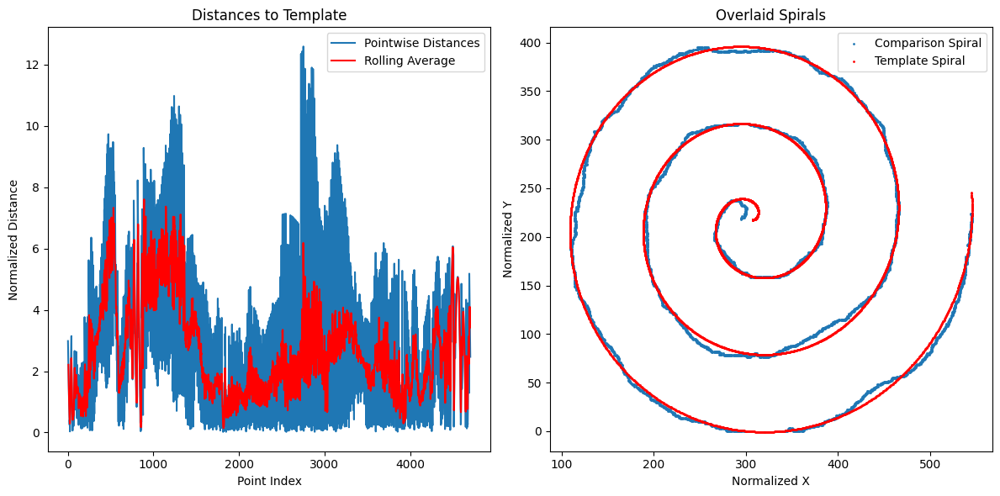

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic9.tiff
the mean distance from template 1.8824776405885864 and variance 2.3153514892291325


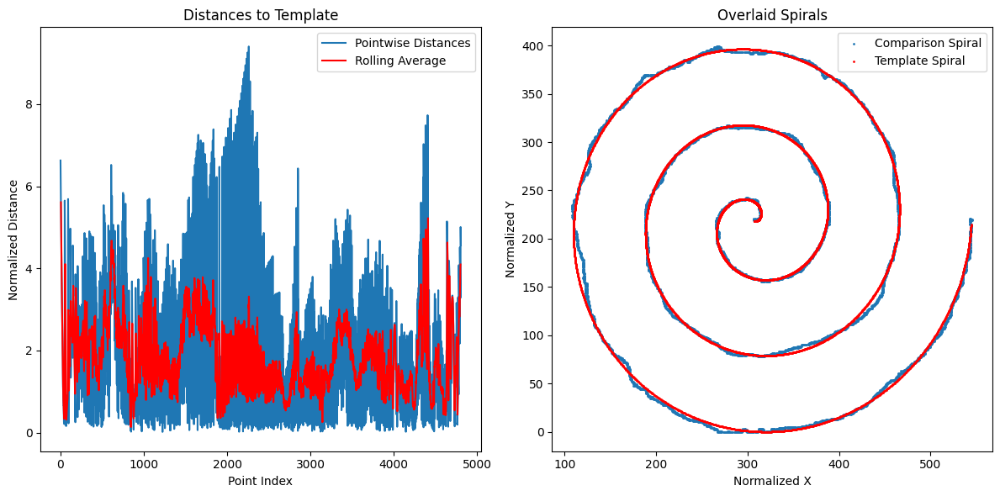

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic10.tiff
the mean distance from template 2.73372873284477 and variance 5.324922447623825


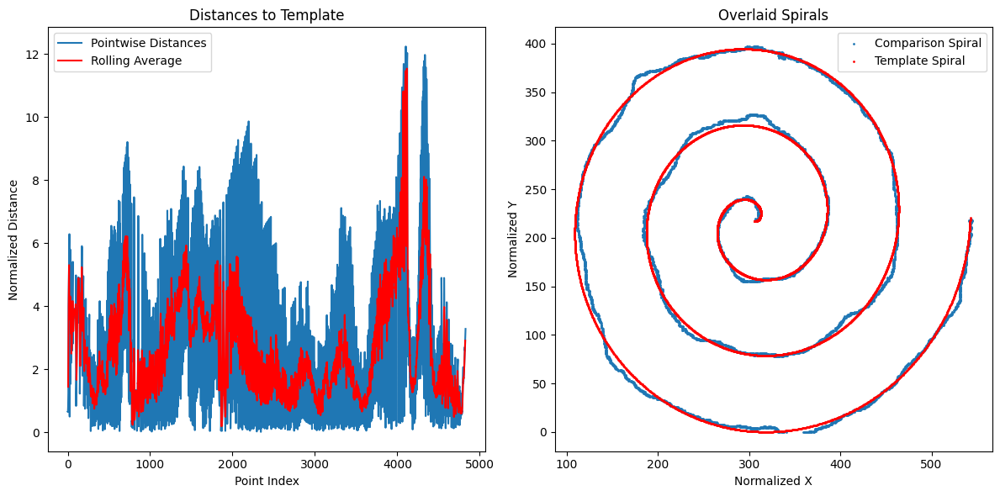

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic11.tiff
the mean distance from template 2.3518563977673175 and variance 3.44505534052489


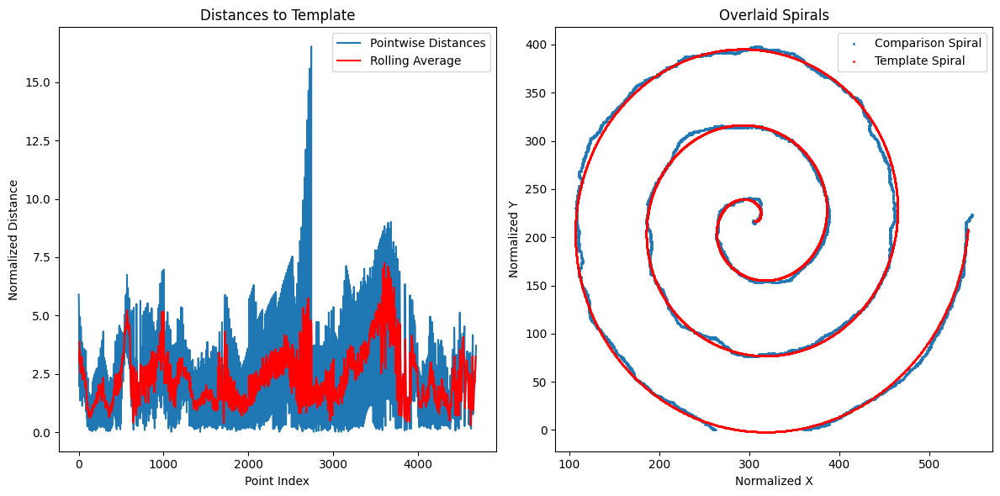

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic12.tiff
the mean distance from template 6.941941941235459 and variance 51.4770361048124


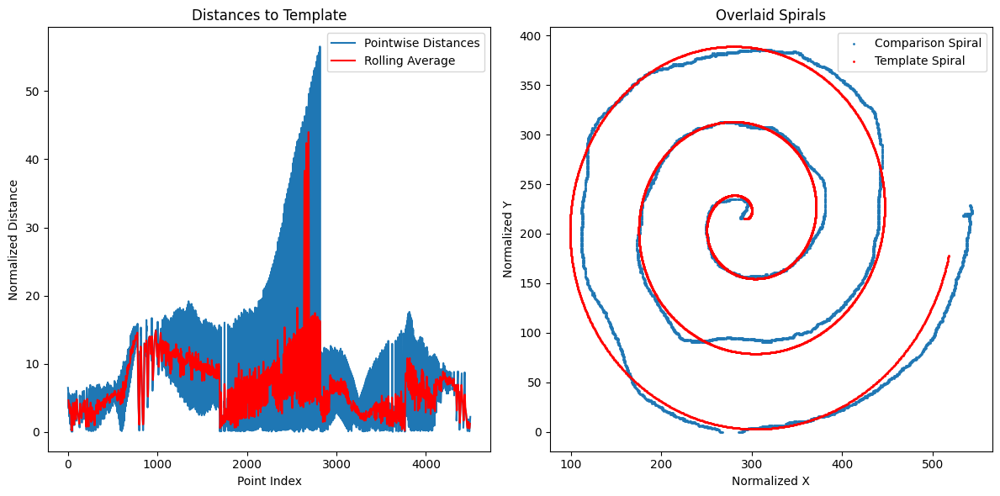

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic13.tiff
the mean distance from template 7.959706683243856 and variance 218.44194106873104


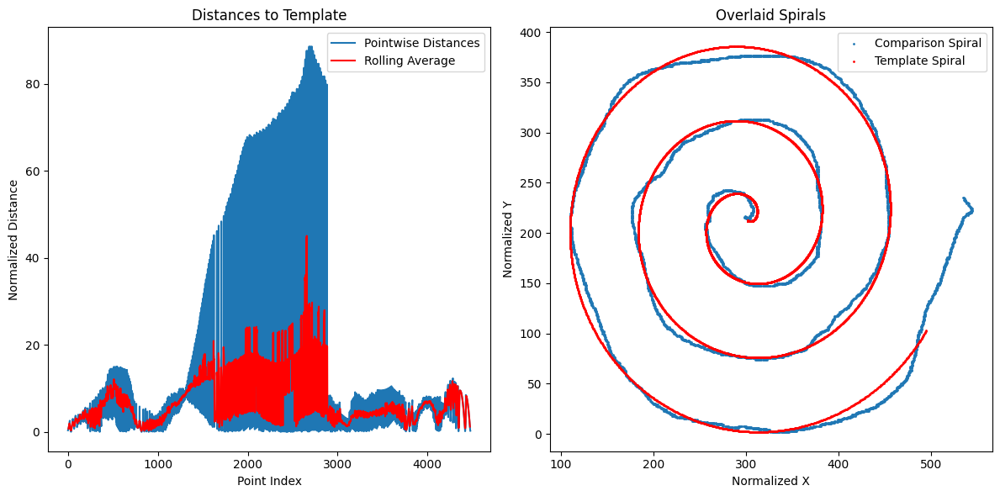

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic14.tiff
the mean distance from template 7.14834219113714 and variance 174.19980453887493


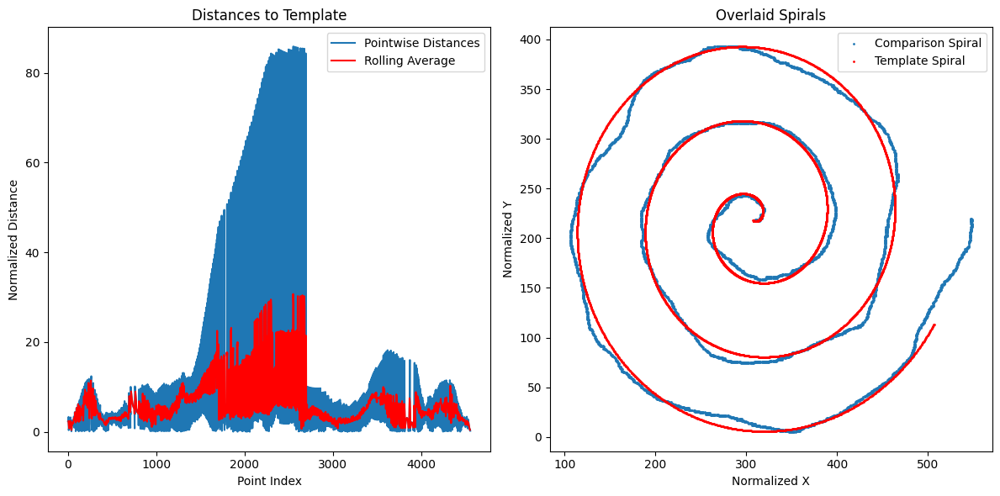

/Users/linusfalk/Dev/Advanced_image_analysis/data/control_dynamic15.tiff
the mean distance from template 3.8081440735570484 and variance 9.851692366443032


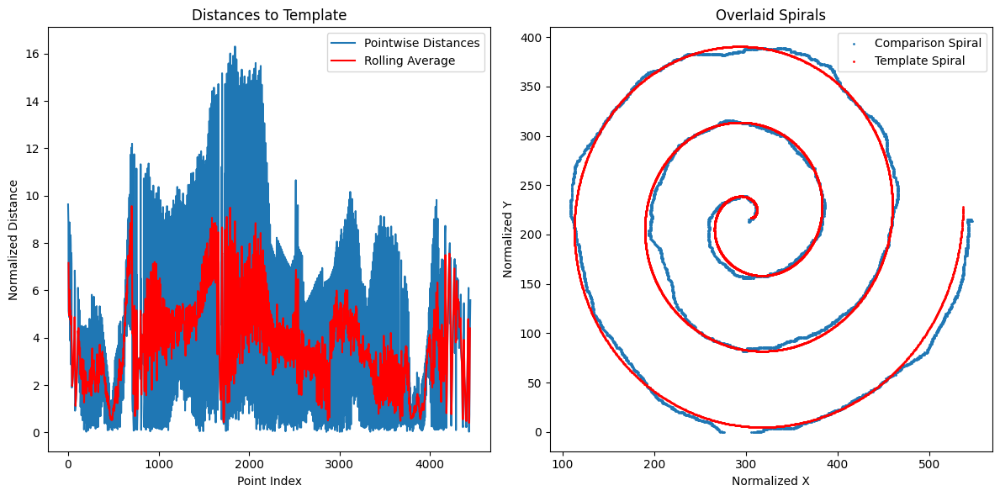

18.70781175358863
1857.806884490714


In [26]:
path = '/Users/linusfalk/Dev/Advanced_image_analysis/data/'
file_list = [f"{path}control_dynamic{i}.tiff" for i in range(1, 16)]
result3 = []
result_tot3 = []
for filepath in file_list: 
    print(filepath) 
    tot_dist, dist, mean, var = optimize(filepath, plot=True)
    result3.append(np.array(dist))
    result_tot3.append(tot_dist)



means3 = []
variances3 = []
for arr in result:
    means3.append(np.mean(arr))
    variances3.append(np.var(arr))

# Calculate overall mean and variance
overall_mean = np.mean(means3)
overall_variance = np.mean(variances3) + np.var(means3)

print(overall_mean)
print(overall_variance)


/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic1.tiff
the mean distance from template 167.5491304901574 and variance 6644.6101938585025


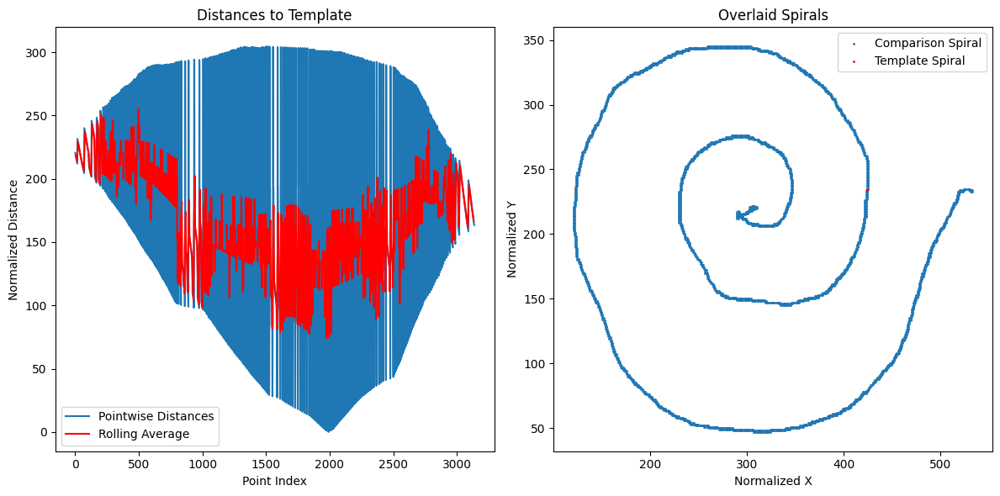

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic2.tiff
the mean distance from template 7.039792786299212 and variance 45.95840051885453


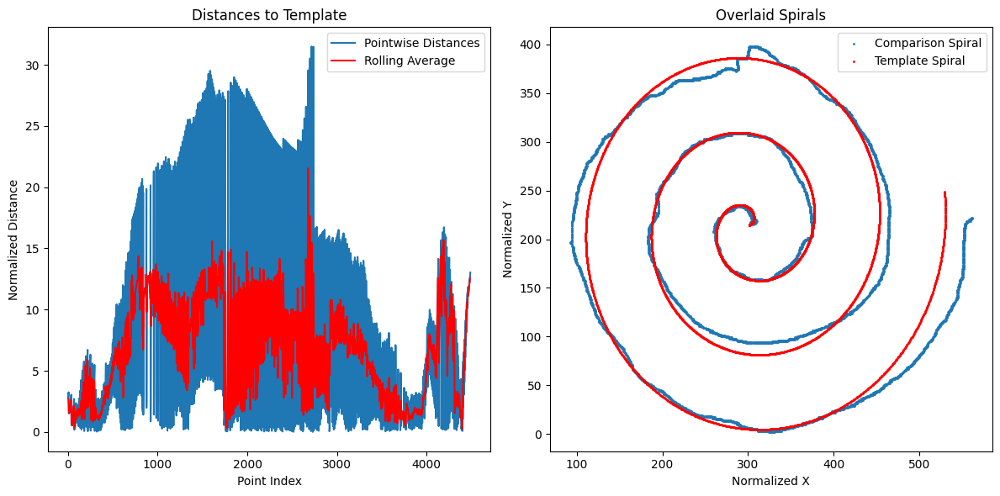

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic3.tiff
the mean distance from template 5.671515750001368 and variance 16.661886147940873


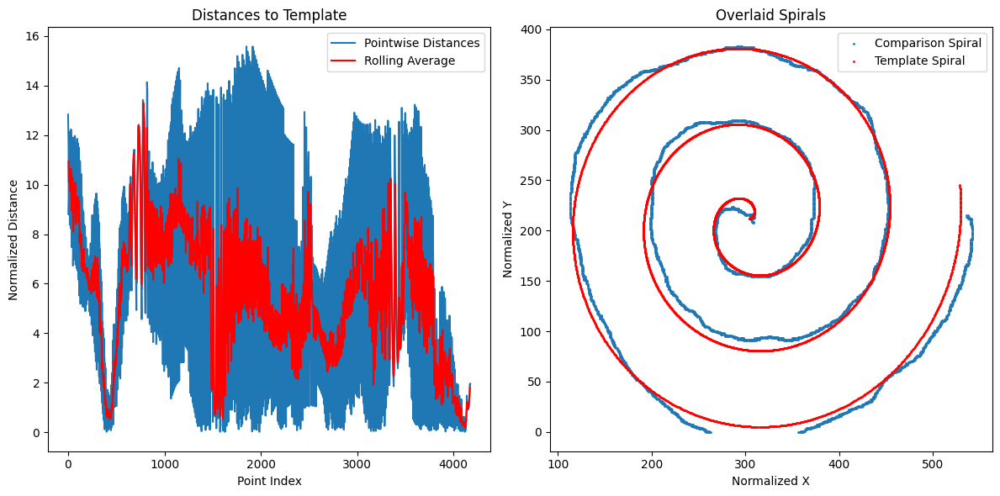

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic4.tiff
the mean distance from template 139.59185344715198 and variance 2967.8390497256155


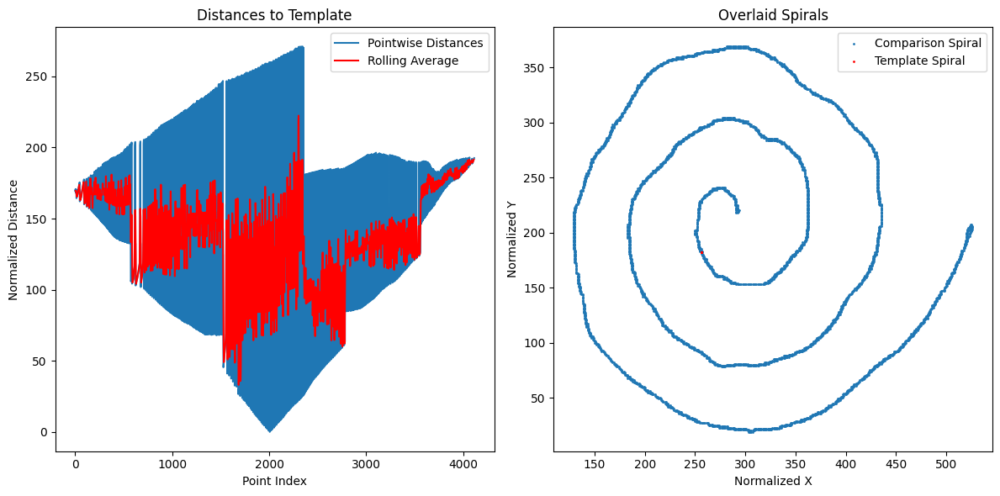

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic5.tiff
the mean distance from template 5.140880106452954 and variance 13.41474345596312


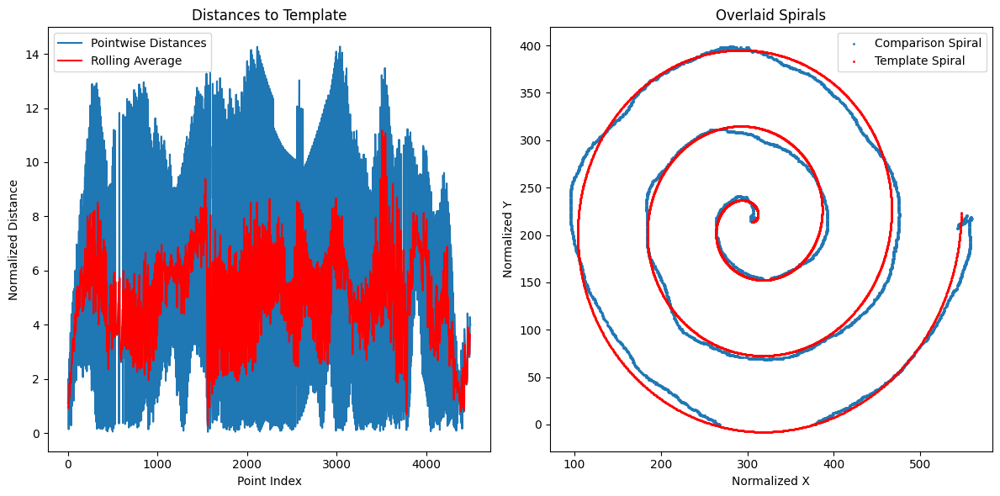

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic6.tiff
the mean distance from template 6.005034542359771 and variance 17.0284203916821


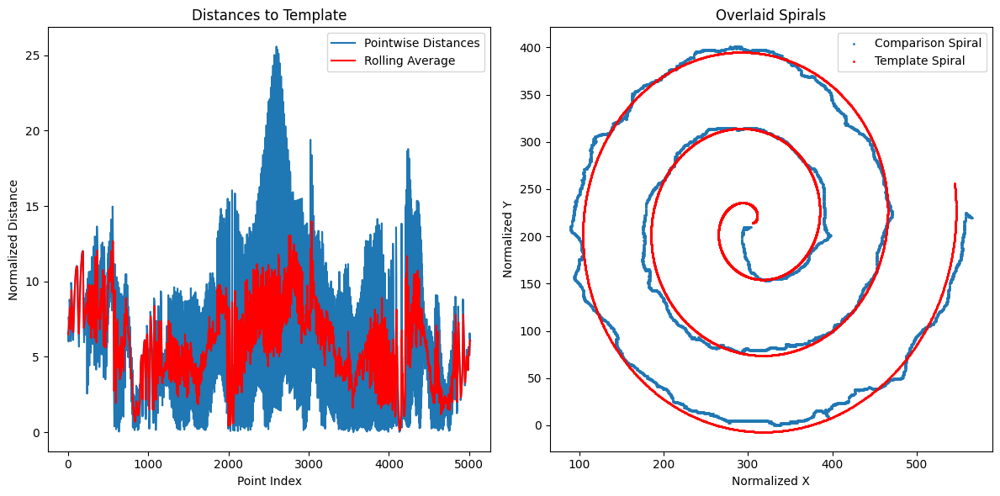

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic7.tiff
the mean distance from template 184.61961201927127 and variance 7357.344436376382


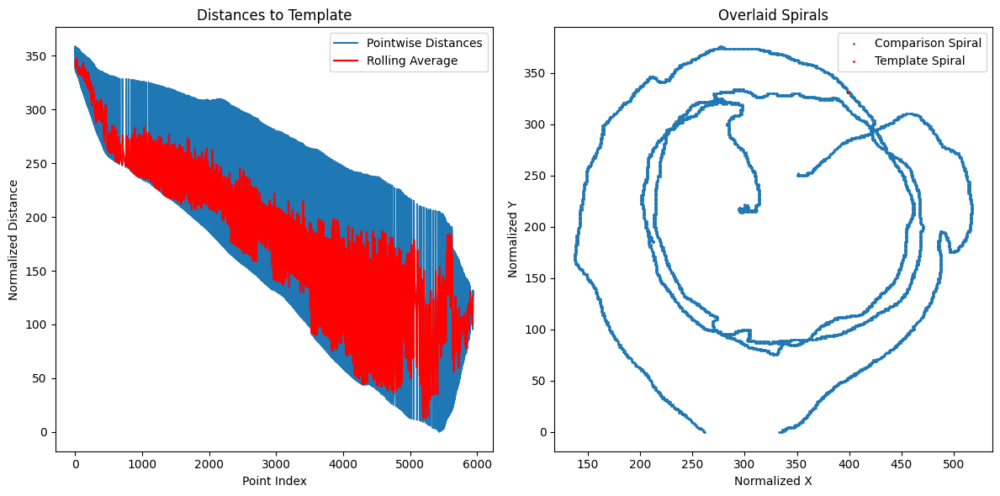

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic8.tiff
the mean distance from template 19.558231189986945 and variance 706.3057809569835


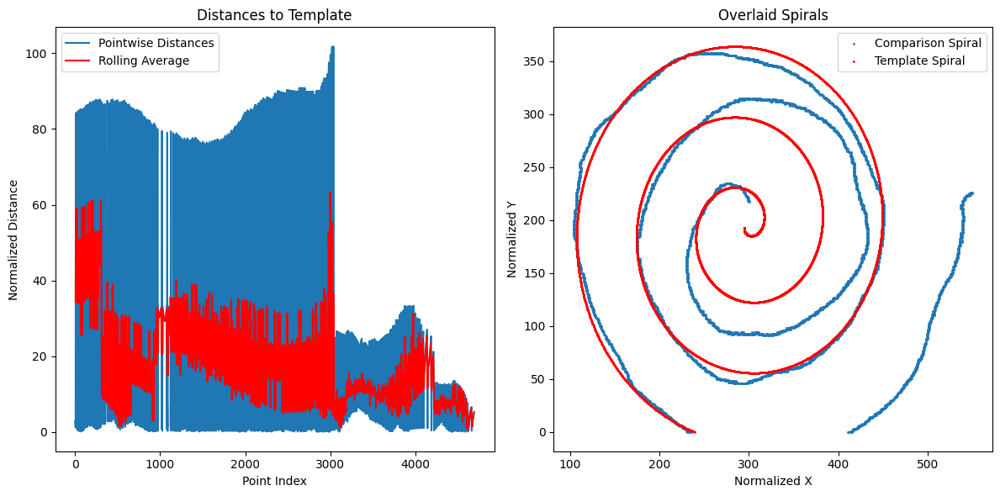

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic9.tiff
the mean distance from template 13.268684275781927 and variance 80.89956297804305


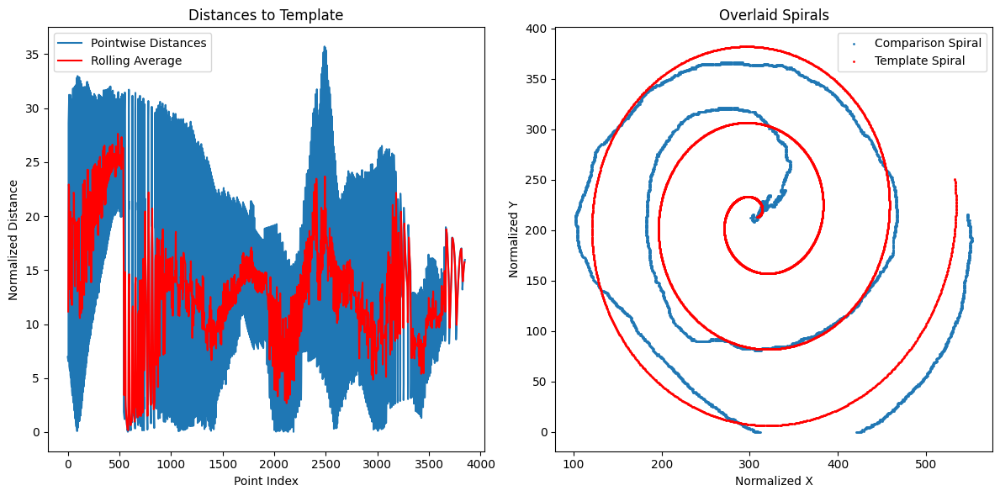

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic10.tiff
the mean distance from template 93.7259498613119 and variance 5079.815525138988


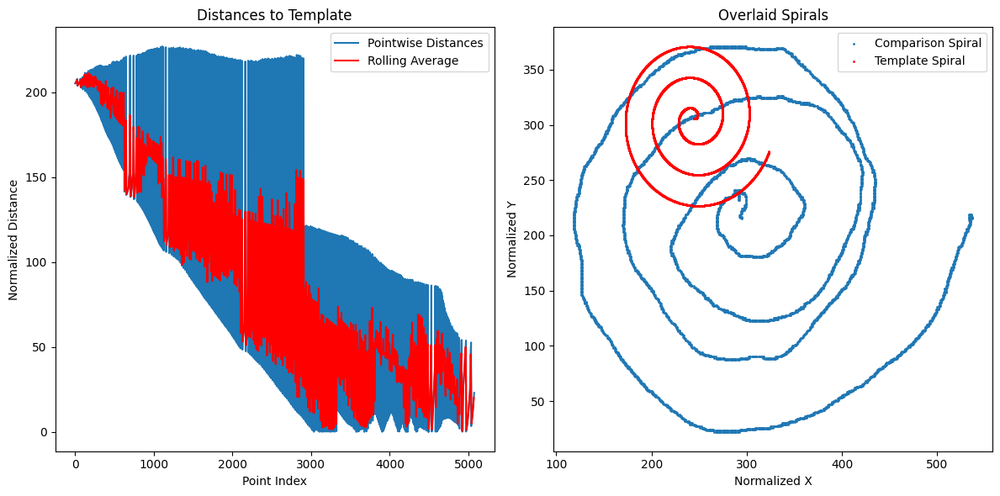

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic11.tiff
the mean distance from template 144.34784696059677 and variance 3120.909777031932


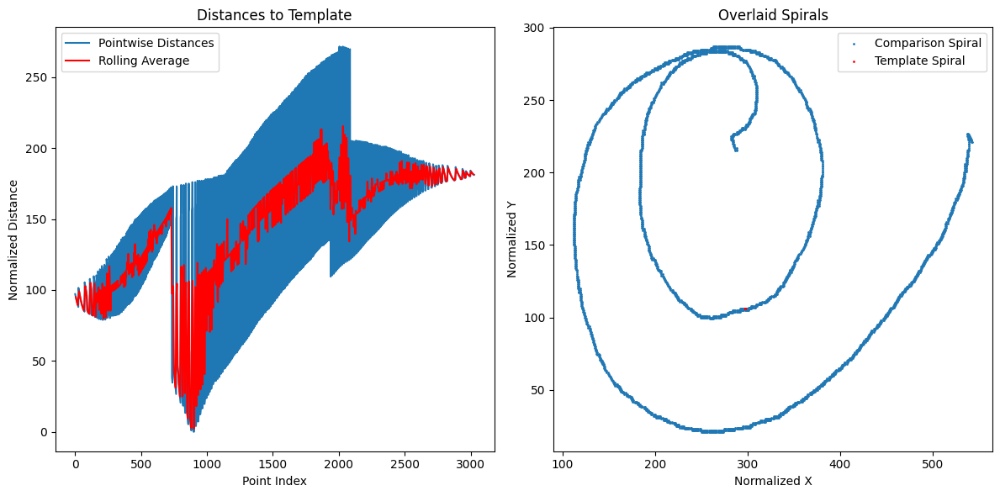

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic12.tiff
the mean distance from template 149.29183246340773 and variance 5031.41739743101


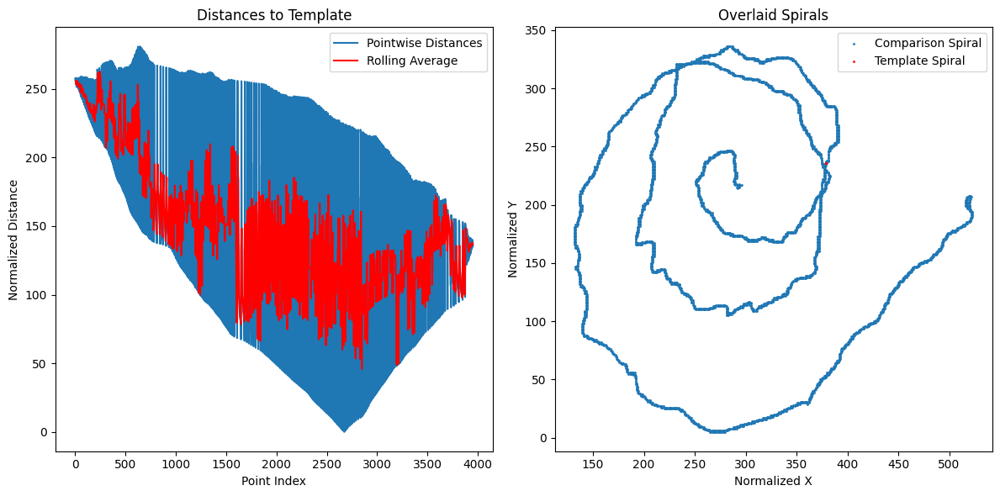

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic13.tiff
the mean distance from template 12.571573786129079 and variance 332.9295638343939


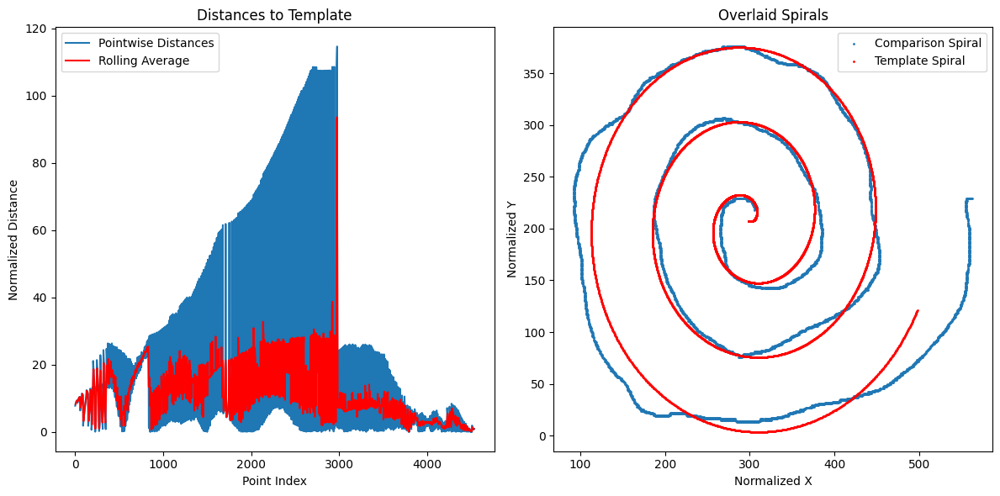

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic14.tiff
the mean distance from template 6.3589735987653295 and variance 26.635669920576245


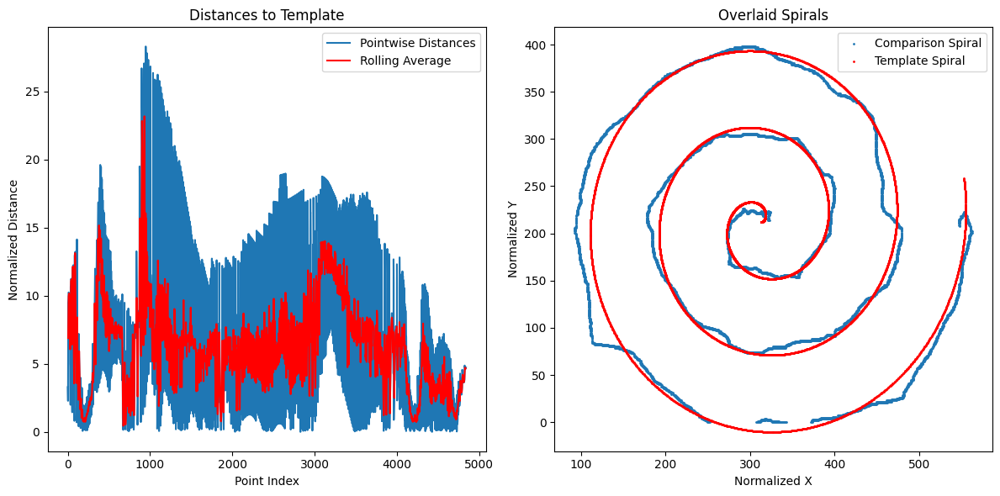

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic15.tiff
the mean distance from template 10.300768228950984 and variance 98.06471012753403


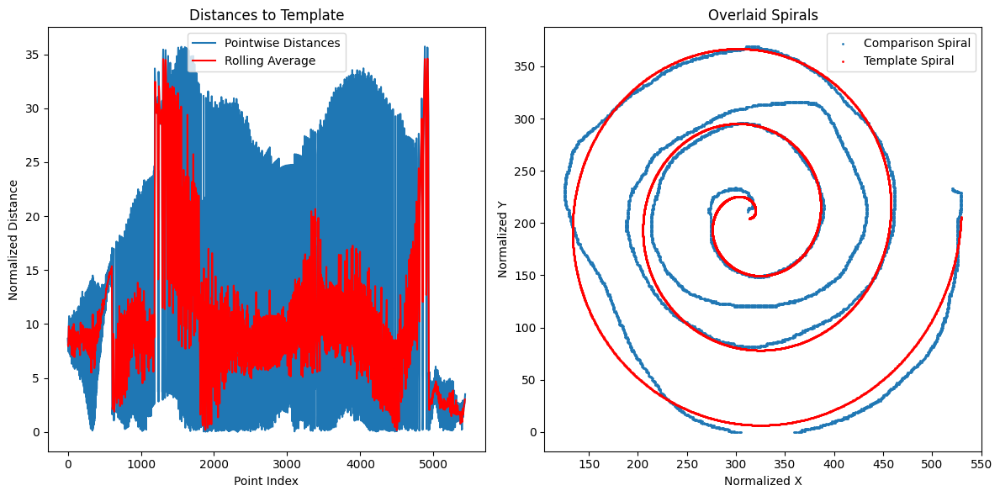

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic16.tiff
the mean distance from template 46.695331334219794 and variance 2232.3836134874446


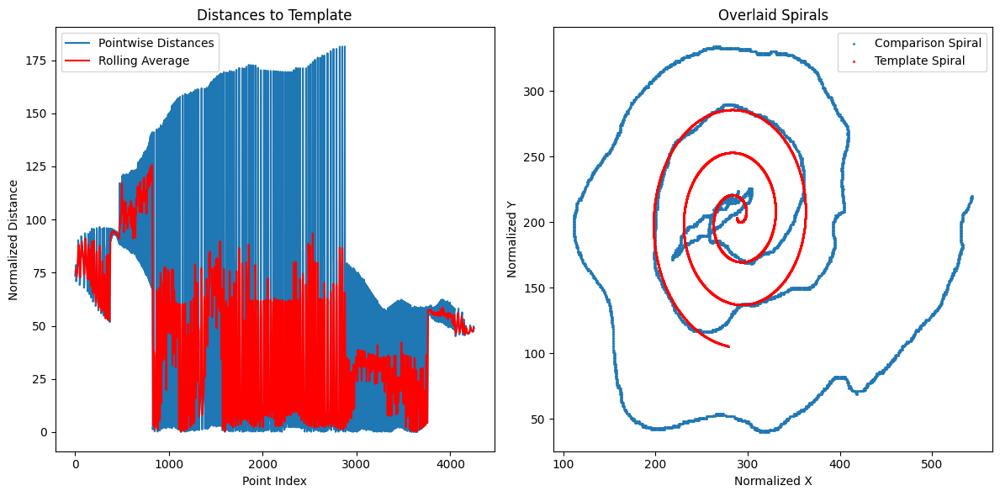

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic17.tiff
the mean distance from template 20.586515409884775 and variance 483.816098002543


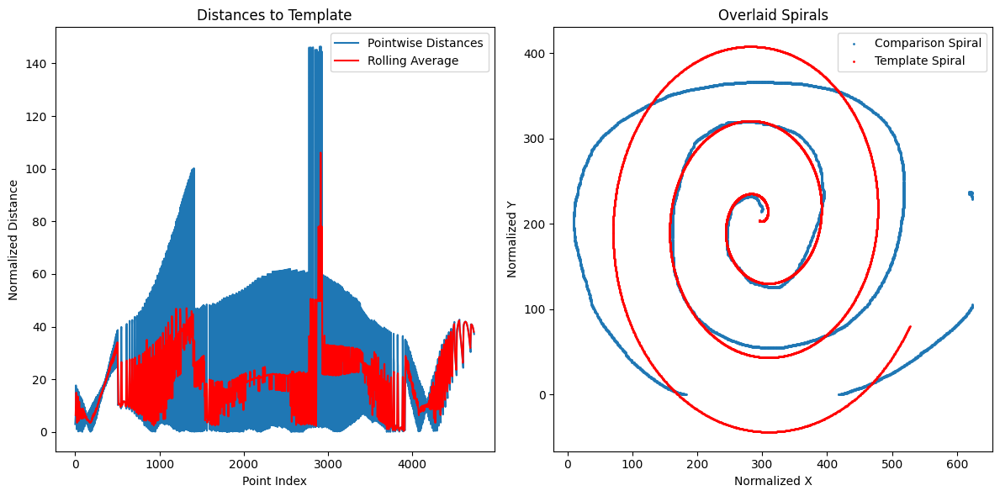

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic18.tiff
the mean distance from template 19.958694953665994 and variance 646.6557512438328


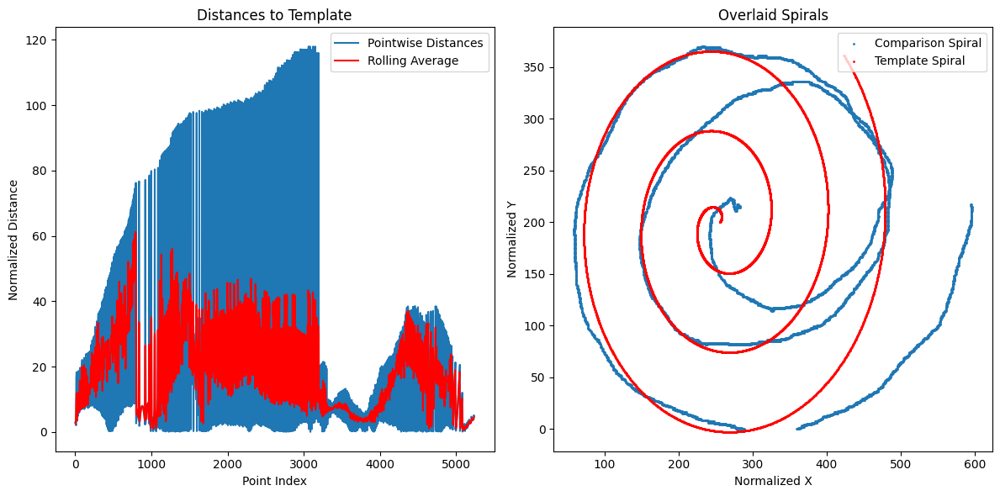

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic19.tiff
the mean distance from template 234.07823886743046 and variance 14369.503177458164


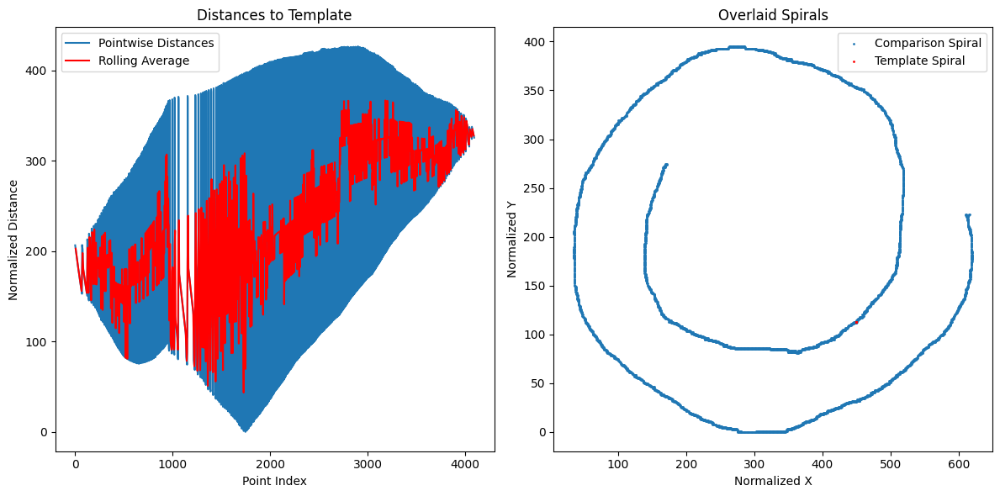

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic20.tiff
the mean distance from template 25.29185377179724 and variance 1304.9482176430229


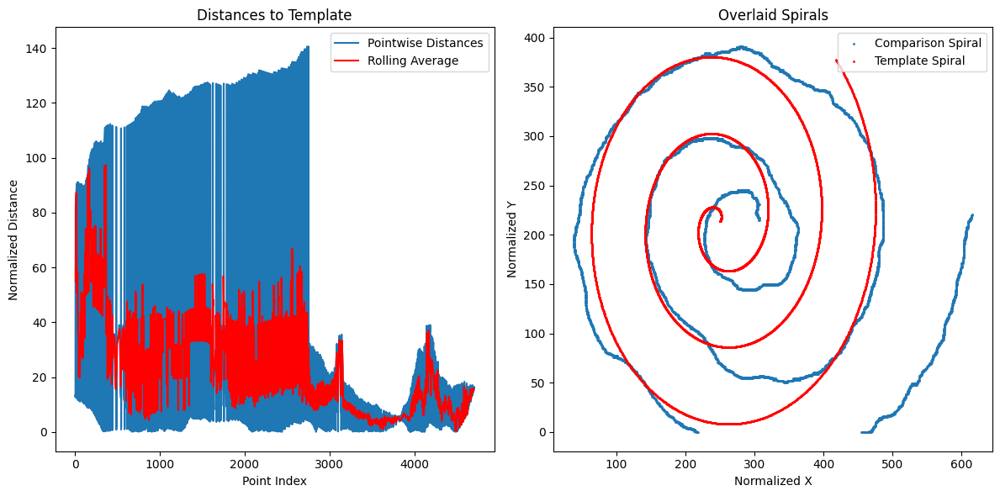

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic21.tiff
the mean distance from template 17.914138610023812 and variance 185.54863251452664


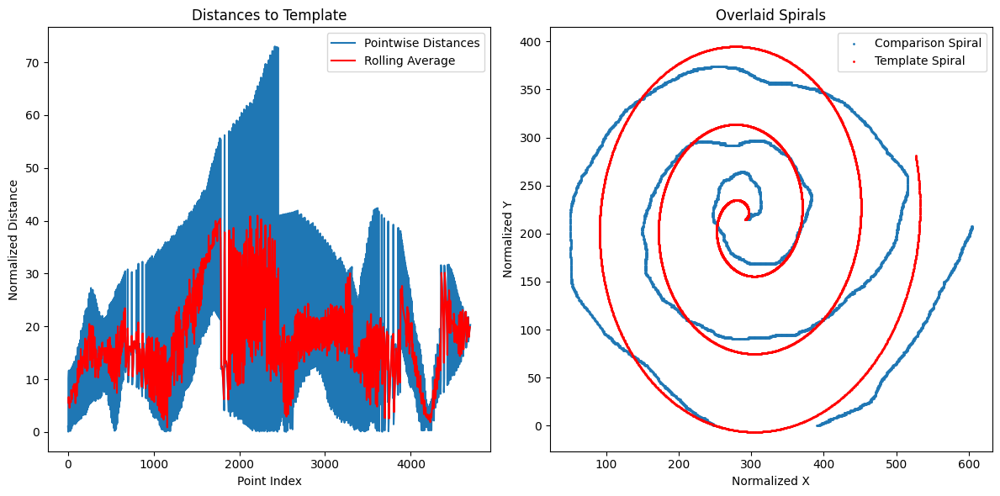

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic22.tiff
the mean distance from template 5.2634423933624745 and variance 15.37224390007841


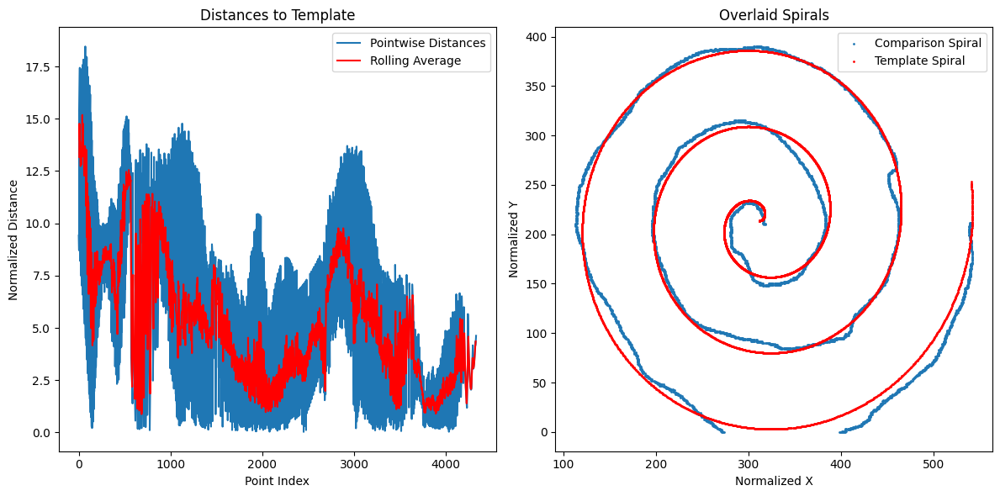

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic23.tiff
the mean distance from template 162.55627330780626 and variance 5897.310654359437


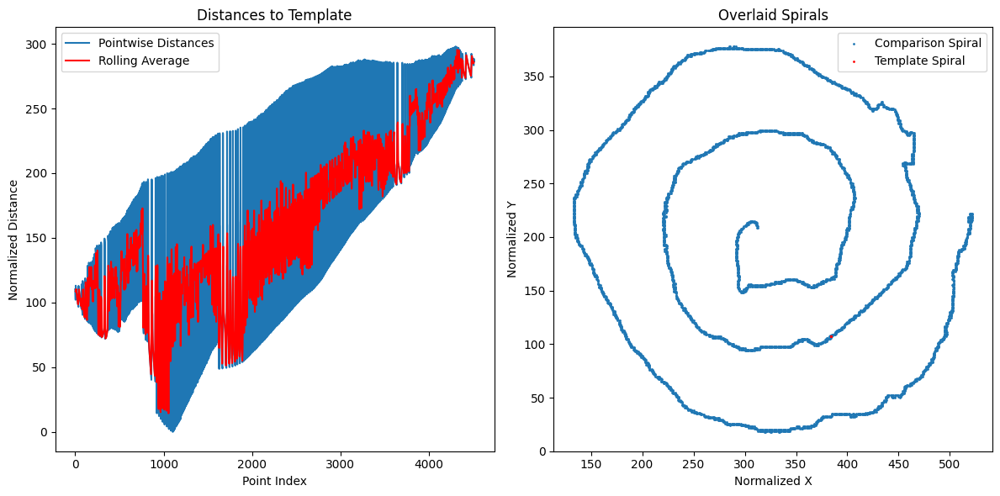

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic24.tiff
the mean distance from template 7.315519211040463 and variance 30.4942657748629


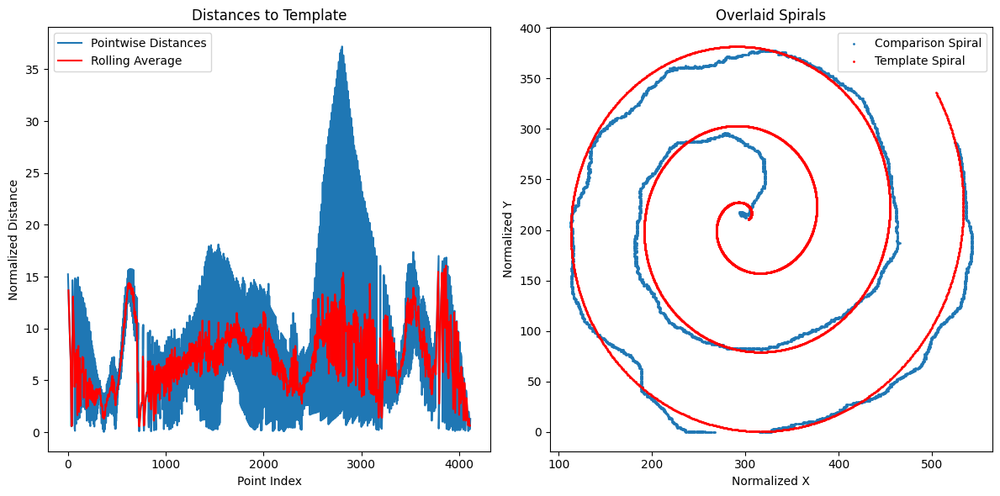

/Users/linusfalk/Dev/Advanced_image_analysis/data/parkinson_dynamic25.tiff
the mean distance from template 7.105859540472576 and variance 31.53685165800065


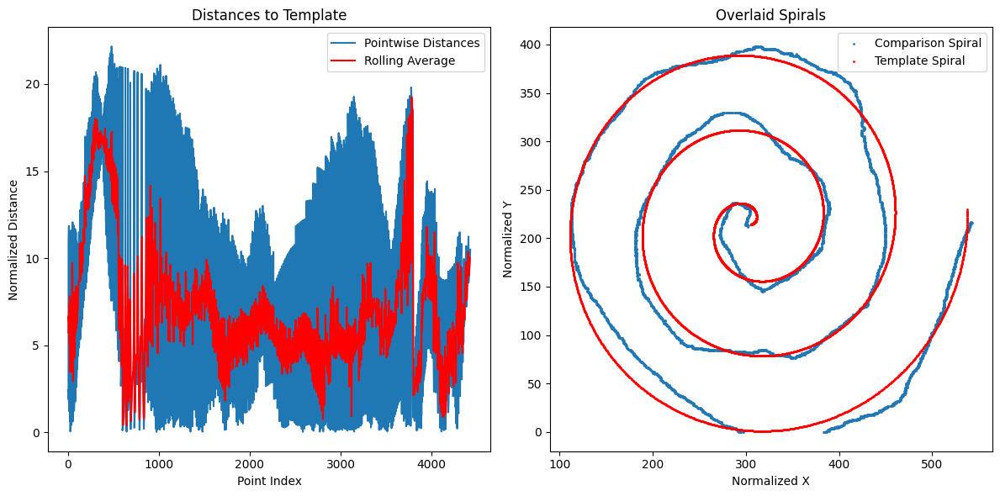

18.70781175358863
1857.806884490714


In [27]:
path = '/Users/linusfalk/Dev/Advanced_image_analysis/data/'
file_list = [f"{path}parkinson_dynamic{i}.tiff" for i in range(1, 26)]
result4 = []
result_tot4 = []
for filepath in file_list: 
    print(filepath) 
    tot_dist, dist, mean, var = optimize(filepath, plot=True)
    result4.append(np.array(dist))
    result_tot4.append(tot_dist)



means4 = []
variances4 = []
for arr in result:
    means4.append(np.mean(arr))
    variances4.append(np.var(arr))

# Calculate overall mean and variance
overall_mean = np.mean(means3)
overall_variance = np.mean(variances3) + np.var(means3)

print(overall_mean)
print(overall_variance)